In [1]:
!rm -rf /kaggle/working/*

# **DataSet Selection**


https://www.kaggle.com/datasets/awsaf49/cbis-ddsm-breast-cancer-image-dataset/data

Summary This CBIS-DDSM (Curated Breast Imaging Subset of DDSM) is an updated and standardized version of the Digital Database for Screening Mammography (DDSM). The DDSM is a database of 2,620 scanned film mammography studies. It contains normal, benign, and malignant cases with verified pathology information. The database's scale and ground truth validation make the DDSM a useful tool in developing and testing decision support systems. The CBIS-DDSM collection includes a subset of the DDDSM data selected and curated by a trained mammographer. The images have been decompressed and converted to DICOM format. Updated ROI segmentation and bounding boxes, and pathologic diagnosis for training data are also included. A manuscript describing how to use this dataset in detail is available at https://www.nature.com/articles/sdata2017177.

Published research results from work in developing decision support systems in mammography are difficult to replicate due to the lack of a standard evaluation data set; most computer-aided diagnosis (CADx) and detection (CADe) algorithms for breast cancer in mammography are evaluated on private data sets or on unspecified subsets of public databases. Few well-curated public datasets have been provided for the mammography community. These include the DDSM, the Mammographic Imaging Analysis Society (MIAS) database, and the Image Retrieval in Medical Applications (IRMA) project. Although these public data sets are useful, they are limited in terms of data set size and accessibility.

For example, most researchers using the DDSM do not leverage all its images for a variety of historical reasons. When the database was released in 1997, computational resources to process hundreds or thousands of images were not widely available. Additionally, the DDSM images are saved in non-standard compression files that require the use of decompression code that has not been updated or maintained for modern computers. Finally, the ROI annotations for the abnormalities in the DDSM were provided to indicate a general position of lesions, but not a precise segmentation for them. Therefore, many researchers must implement segmentation algorithms for accurate feature extraction. This causes an inability to compare the performance of methods directly or to replicate prior results. The CBIS-DDSM collection addresses that challenge by publicly releasing a curated and standardized version of the DDSM for evaluation of future CADx and CADe systems (sometimes referred to generally as CAD) research in mammography.

Please note that the image data for this collection is structured such that each participant has multiple patient IDs. For example, participant 00038 has 10 separate patient IDs which provide information about the scans within the IDs (e.g. Calc-Test_P_00038_LEFT_CC, Calc-Test_P_00038_RIGHT_CC_1). This makes it appear as though there are 6,671 patients according to the DICOM metadata, but there are only 1,566 actual participants in the cohort.

# Import necessary libraries

In [2]:
import os
import PIL
import cv2
import uuid
import shutil
import random
import glob as gb
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline

from PIL import Image
from tqdm import tqdm  # Progress bar
from scipy.special import gamma

from keras.optimizers import *
from keras.regularizers import l1_l2
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Input
from keras.layers import GlobalAveragePooling2D
from keras.callbacks import LearningRateScheduler
from keras.layers import Conv2D, MaxPool2D, BatchNormalization

from tensorflow.keras.metrics import *
from tensorflow.keras.callbacks import *
from tensorflow.keras.preprocessing.image import ImageDataGenerator

2025-04-28 14:00:00.005222: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745848800.407650      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745848800.521710      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Preparing the dataset 

In [3]:
os.listdir('/kaggle/input')

['cbis-ddsm-breast-cancer-image-dataset', 'iris-flower-dataset']

In [4]:
calc_train = pd.read_csv('/kaggle/input/cbis-ddsm-breast-cancer-image-dataset/csv/calc_case_description_train_set.csv')
calc_test = pd.read_csv('/kaggle/input/cbis-ddsm-breast-cancer-image-dataset/csv/calc_case_description_test_set.csv')
mass_train = pd.read_csv('/kaggle/input/cbis-ddsm-breast-cancer-image-dataset/csv/mass_case_description_train_set.csv')
mass_test = pd.read_csv('/kaggle/input/cbis-ddsm-breast-cancer-image-dataset/csv/mass_case_description_test_set.csv')
dicom_df = pd.read_csv('/kaggle/input/cbis-ddsm-breast-cancer-image-dataset/csv/dicom_info.csv')

In [5]:
def replace_path(sample, old_path, new_path):
    return sample.replace(old_path, new_path, regex=True)

In [6]:
cropped_images = dicom_df[dicom_df.SeriesDescription=="cropped images"].image_path
full_mammogram = dicom_df[dicom_df.SeriesDescription=="full mammogram images"].image_path
roi_mask = dicom_df[dicom_df.SeriesDescription=="ROI mask images"].image_path

In [7]:
# Replace the path for cropped_images to the correct directory.
correct_dir = "../input/cbis-ddsm-breast-cancer-image-dataset/jpeg"
cropped_images = replace_path(cropped_images, "CBIS-DDSM/jpeg", correct_dir)
print('Cropped Images paths:')
print(cropped_images.iloc[0]) # Print to ensure everything looks correct.

Cropped Images paths:
../input/cbis-ddsm-breast-cancer-image-dataset/jpeg/1.3.6.1.4.1.9590.100.1.2.129308726812851964007517874181459556304/1-172.jpg


In [8]:
# Replace the path for full_mammogram images to the correct directory.
full_mammogram = replace_path(full_mammogram, "CBIS-DDSM/jpeg", correct_dir)
print('\nFull mammo Images paths:')
print(full_mammogram.iloc[0]) # Print to ensure everything looks correct.


Full mammo Images paths:
../input/cbis-ddsm-breast-cancer-image-dataset/jpeg/1.3.6.1.4.1.9590.100.1.2.248386742010678582309005372213277814849/1-249.jpg


In [9]:
# Replace the path for roi_mask images to the correct directory.
roi_mask = replace_path(roi_mask, "CBIS-DDSM/jpeg", correct_dir)
print('\nROI Mask Images paths:')
print(roi_mask.iloc[0]) # Print to ensure everything looks correct.


ROI Mask Images paths:
../input/cbis-ddsm-breast-cancer-image-dataset/jpeg/1.3.6.1.4.1.9590.100.1.2.153339052913121382622526066491844156138/2-270.jpg


In [10]:
def get_image_file_name(data, new_dict):

    for dicom in data:
        key = dicom.split('/')[4]
        new_dict[key] = dicom
    print(f"the length of dataset ==> {len(new_dict.keys())}")


cropped_images_dict = dict()
full_mammo_dict = dict()
roi_img_dict = dict()

get_image_file_name(cropped_images, cropped_images_dict)
get_image_file_name(full_mammogram, full_mammo_dict)
get_image_file_name(roi_mask, roi_img_dict)

the length of dataset ==> 3567
the length of dataset ==> 2857
the length of dataset ==> 3247


In [11]:
def fix_image_path(data):
    """Correct dicom paths to correct image paths."""
    for indx, image in enumerate(data.values):

        img_name = image[11].split('/')[2]

        if img_name in full_mammo_dict:
            data.iloc[indx, 11] = full_mammo_dict[img_name]
        else:
            data.iloc[indx, 11] = None
        
        img_name = image[12].split('/')[2]
        if img_name in cropped_images_dict:
            data.iloc[indx, 12] = cropped_images_dict[img_name]
        else:
            data.iloc[indx, 11] = None

        img_name = image[13].split('/')[2]
        if img_name in roi_img_dict:
            data.iloc[indx, 13] = roi_img_dict[img_name]

        else:
            data.iloc[indx, 13] = None

In [12]:
fix_image_path(mass_train)

mass_train = mass_train.rename(columns={'left or right breast': 'left_or_right_breast',
                                        'image view': 'image_view',
                                        'abnormality id': 'abnormality_id',
                                        'abnormality type': 'abnormality_type',
                                        'mass shape': 'mass_shape',
                                        'mass margins': 'mass_margins',
                                        'image file path': 'image_file_path',
                                        'cropped image file path': 'cropped_image_file_path',
                                        'ROI mask file path': 'ROI_mask_file_path'})
mass_train.head(5)

mass_train.pathology.unique()

array(['MALIGNANT', 'BENIGN', 'BENIGN_WITHOUT_CALLBACK'], dtype=object)

In [13]:
fix_image_path(mass_test)

mass_test = mass_test.rename(columns={'left or right breast': 'left_or_right_breast',
                                      'image view': 'image_view',
                                      'abnormality id': 'abnormality_id',
                                      'abnormality type': 'abnormality_type',
                                      'mass shape': 'mass_shape',
                                      'mass margins': 'mass_margins',
                                      'image file path': 'image_file_path',
                                      'cropped image file path': 'cropped_image_file_path',
                                      'ROI mask file path': 'ROI_mask_file_path'})
# view renamed columns
mass_test.head()

,patient_id,breast_density,left_or_right_breast,image_view,abnormality_id,abnormality_type,mass_shape,mass_margins,assessment,pathology,subtlety,image_file_path,cropped_image_file_path,ROI_mask_file_path
0,P_00016,4,LEFT,CC,1,mass,IRREGULAR,SPICULATED,5,MALIGNANT,5,../input/cbis-ddsm-breast-cancer-image-dataset...,../input/cbis-ddsm-breast-cancer-image-dataset...,../input/cbis-ddsm-breast-cancer-image-dataset...
1,P_00016,4,LEFT,MLO,1,mass,IRREGULAR,SPICULATED,5,MALIGNANT,5,../input/cbis-ddsm-breast-cancer-image-dataset...,../input/cbis-ddsm-breast-cancer-image-dataset...,../input/cbis-ddsm-breast-cancer-image-dataset...
2,P_00017,2,LEFT,CC,1,mass,ROUND,CIRCUMSCRIBED,4,MALIGNANT,4,../input/cbis-ddsm-breast-cancer-image-dataset...,../input/cbis-ddsm-breast-cancer-image-dataset...,../input/cbis-ddsm-breast-cancer-image-dataset...
3,P_00017,2,LEFT,MLO,1,mass,ROUND,ILL_DEFINED,4,MALIGNANT,4,../input/cbis-ddsm-breast-cancer-image-dataset...,../input/cbis-ddsm-breast-cancer-image-dataset...,../input/cbis-ddsm-breast-cancer-image-dataset...
4,P_00032,3,RIGHT,CC,1,mass,ROUND,OBSCURED,0,BENIGN,2,../input/cbis-ddsm-breast-cancer-image-dataset...,../input/cbis-ddsm-breast-cancer-image-dataset...,../input/cbis-ddsm-breast-cancer-image-dataset...


In [14]:
calc_train = calc_train.rename(columns={'left or right breast': 'left_or_right_breast',
                                        'image view': 'image_view',
                                        'abnormality id': 'abnormality_id',
                                        'abnormality type': 'abnormality_type',
                                        'mass shape': 'mass_shape',
                                        'mass margins': 'mass_margins',
                                        'image file path': 'image_file_path',
                                        'cropped image file path': 'cropped_image_file_path',
                                        'ROI mask file path': 'ROI_mask_file_path'})
# view renamed columns
calc_train.head()

fix_image_path(calc_train)

In [15]:
calc_test = calc_test.rename(columns={'left or right breast': 'left_or_right_breast',
                                      'image view': 'image_view',
                                      'abnormality id': 'abnormality_id',
                                      'abnormality type': 'abnormality_type',
                                      'mass shape': 'mass_shape',
                                      'mass margins': 'mass_margins',
                                      'image file path': 'image_file_path',
                                      'cropped image file path': 'cropped_image_file_path',
                                      'ROI mask file path': 'ROI_mask_file_path'})
# view renamed columns
calc_test.head()

fix_image_path(calc_test)

## Displays images in dataset

In [16]:
def display_images(dataset, column, number):
    """Displays images in dataset, handling missing files and converting formats."""
    
    # create figure and axes
    fig, axes = plt.subplots(1, number, figsize=(15, 5))
    
    # Loop through rows and display images
    for index, (i, row) in enumerate(dataset.head(number).iterrows()):
        image_path = row[column]
        
       # Check if image_path is valid (not None) and exists
        if image_path is None or not os.path.exists(image_path):
            # print(f"File not found or invalid path: {image_path}")
            continue
        
        image = cv2.imread(image_path)
        
        # Handle case when image can't be read
        if image is None:
            # print(f"Error reading image: {image_path}")
            continue
        
        # Convert BGR to RGB if needed (for correct color display)
        if len(image.shape) == 3 and image.shape[2] == 3:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        ax = axes[index]
        ax.imshow(image, cmap='gray' if len(image.shape) == 2 else None)
        ax.set_title(f"{row['pathology']}")
        ax.axis('off')
        print(np.array(image).shape)
    
    plt.tight_layout()
    plt.show()

**display in mass train**

Full Mammograms:

(4808, 3024, 3)
(4800, 2656, 3)
(5491, 2986, 3)
(5491, 3046, 3)
(5491, 2911, 3)


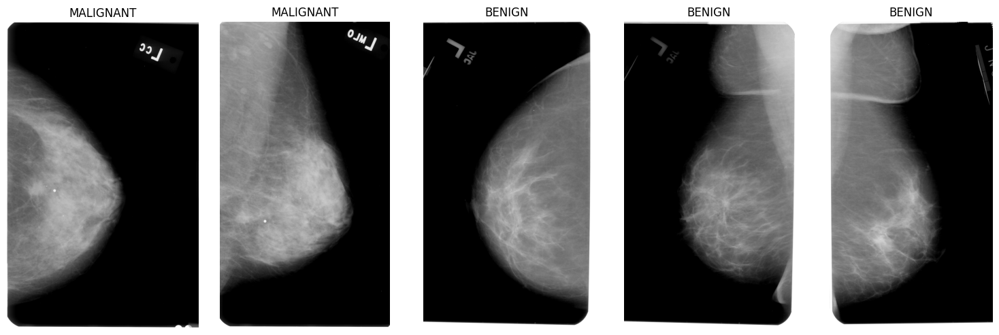

Cropped Mammograms:

(515, 431, 3)
(292, 256, 3)
(466, 423, 3)
(427, 422, 3)
(399, 465, 3)


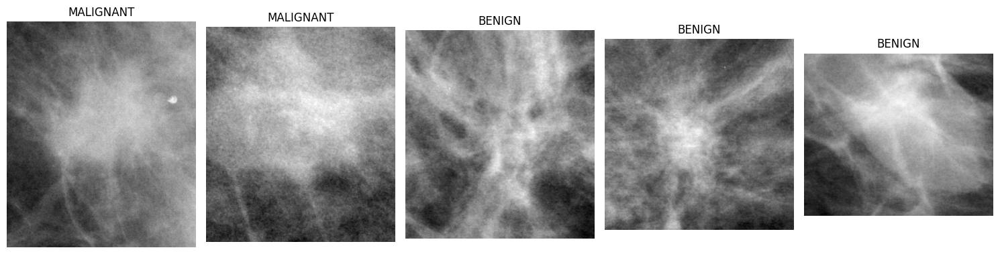

ROI_mask:

(4808, 3024, 3)
(4800, 2656, 3)
(5491, 2986, 3)
(5491, 3046, 3)
(5491, 2911, 3)


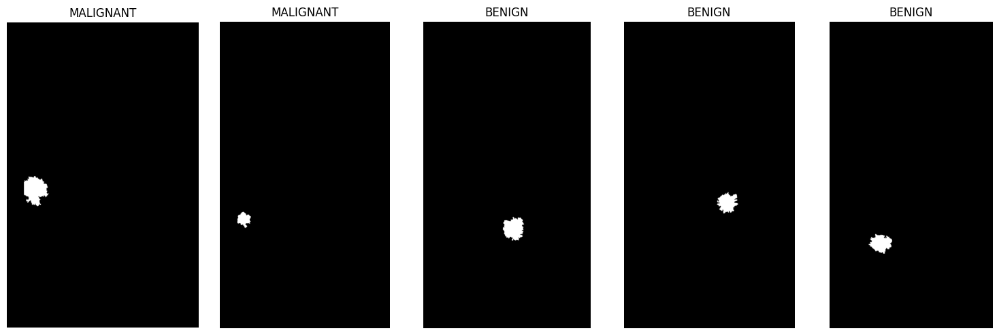

In [17]:
print('Full Mammograms:\n')
display_images(mass_train, 'image_file_path', 5)
print('Cropped Mammograms:\n')
display_images(mass_train, 'cropped_image_file_path', 5)
print('ROI_mask:\n')
display_images(mass_train, 'ROI_mask_file_path', 5)

**display in mass test**

Full Mammograms:

(4006, 1846, 3)
(5491, 2011, 3)
(5904, 3200, 3)
(5952, 3352, 3)
(5116, 2641, 3)


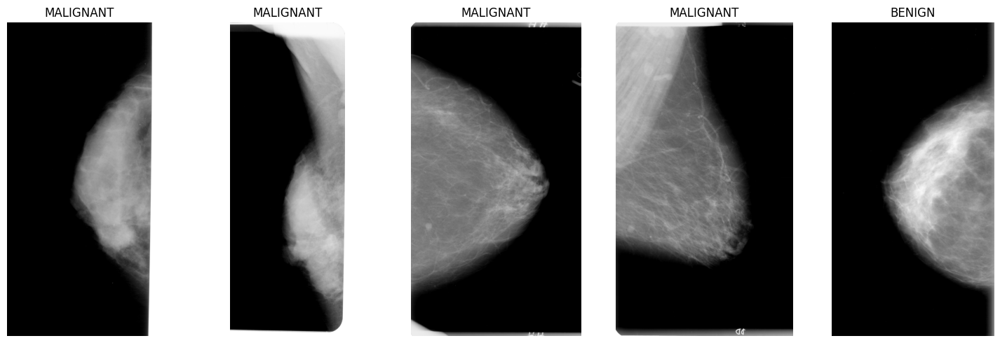

Cropped Mammograms:

(384, 385, 3)
(369, 328, 3)
(214, 195, 3)
(220, 225, 3)
(405, 376, 3)


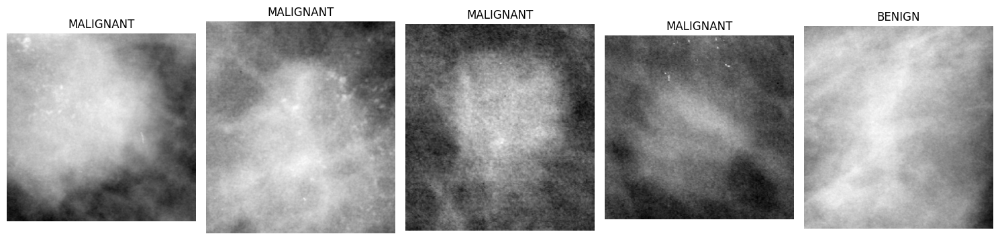

ROI_mask:

(4006, 1846, 3)
(5491, 2011, 3)
(5904, 3200, 3)
(5952, 3352, 3)
(5116, 2641, 3)


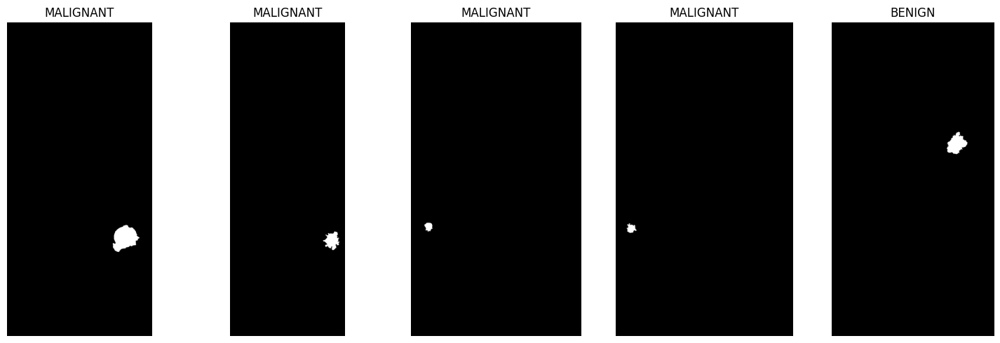

In [18]:
print('Full Mammograms:\n')
display_images(mass_test, 'image_file_path', 5)
print('Cropped Mammograms:\n')
display_images(mass_test, 'cropped_image_file_path', 5)
print('ROI_mask:\n')
display_images(mass_test, 'ROI_mask_file_path', 5)

**display in calc train**

Full Mammograms:

(5056, 2761, 3)
(5386, 2836, 3)
(5356, 2986, 3)
(5491, 3166, 3)
(4568, 3064, 3)


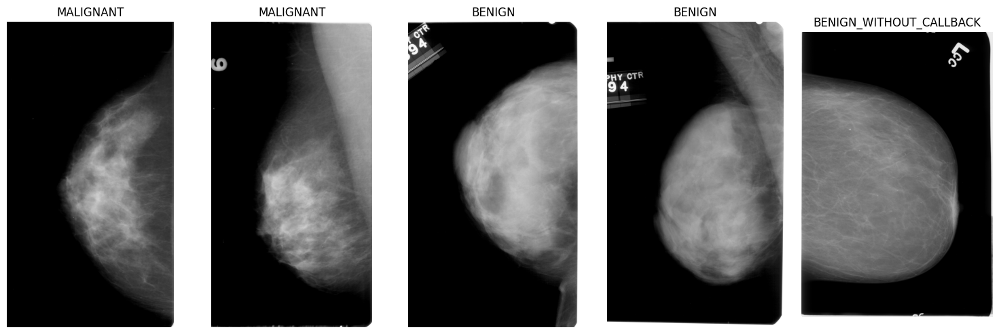

Cropped Mammograms:

(589, 677, 3)
(549, 681, 3)
(681, 577, 3)
(689, 761, 3)
(161, 177, 3)


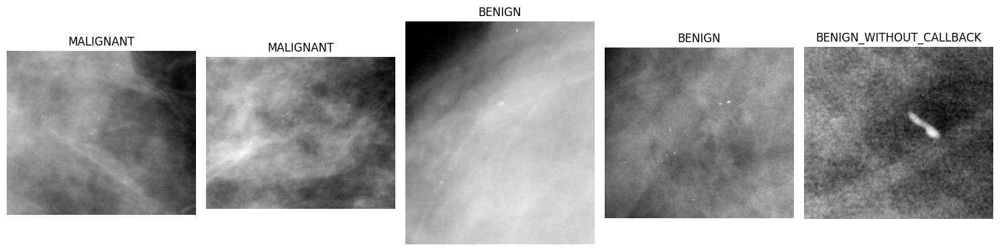

ROI_mask:

(5056, 2761, 3)
(5386, 2836, 3)
(5356, 2986, 3)
(5491, 3166, 3)
(4568, 3064, 3)


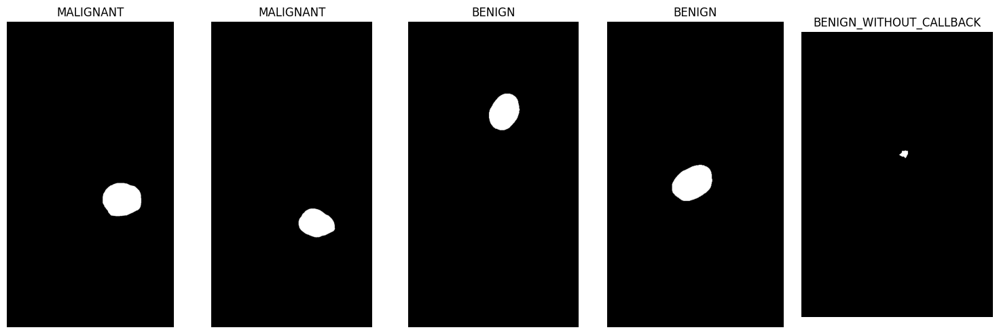

In [19]:
print('Full Mammograms:\n')
display_images(calc_train, 'image_file_path', 5)
print('Cropped Mammograms:\n')
display_images(calc_train, 'cropped_image_file_path', 5)
print('ROI_mask:\n')
display_images(calc_train, 'ROI_mask_file_path', 5)

**display in calc test**

Full Mammograms:



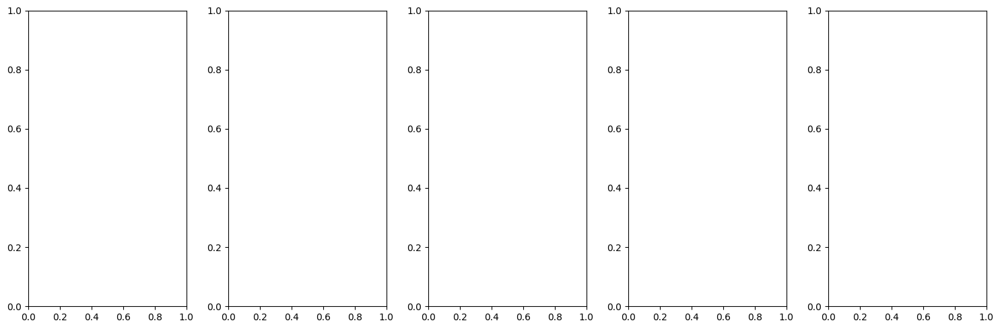

Cropped Mammograms:

(249, 265, 3)
(265, 249, 3)
(409, 660, 3)
(257, 724, 3)
(809, 833, 3)


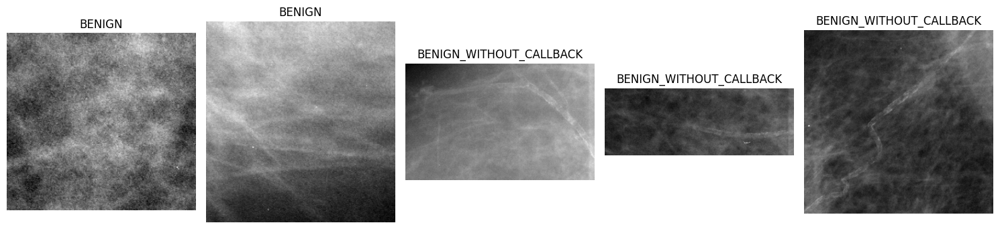

ROI_mask:



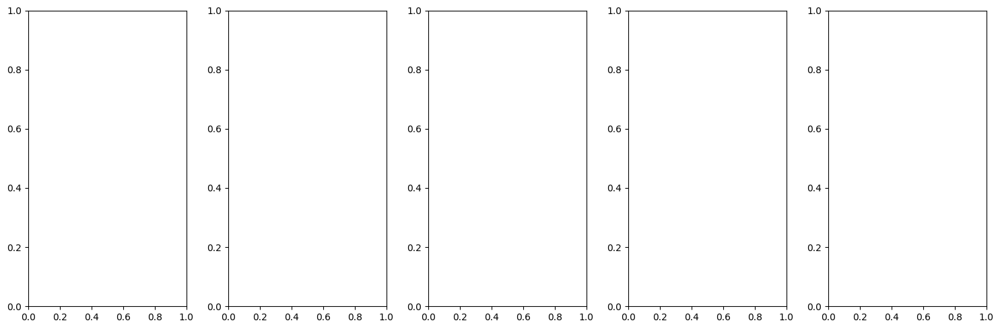

In [20]:
print('Full Mammograms:\n')
display_images(calc_test, 'image_file_path', 5)
print('Cropped Mammograms:\n')
display_images(calc_test, 'cropped_image_file_path', 5)
print('ROI_mask:\n')
display_images(calc_test, 'ROI_mask_file_path', 5)

## combine all data into a single dataset

In [21]:
full_dataset = pd.concat([calc_train, calc_test], axis=0)
len(full_dataset)

1872

In [22]:
class_mapper = {'MALIGNANT': 1, 'BENIGN': 0, 'BENIGN_WITHOUT_CALLBACK': 0} 

In [23]:
#Apply class mapper to pathology column
full_dataset['labels'] = full_dataset['pathology'].replace(class_mapper).infer_objects(copy=False)

full_images = np.array(full_dataset[full_dataset["image_file_path"].notna()]["image_file_path"].tolist())
full_labels = np.array(full_dataset[full_dataset["image_file_path"].notna()]["labels"].tolist())

len(full_images)

/tmp/ipykernel_31/3826206070.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  full_dataset['labels'] = full_dataset['pathology'].replace(class_mapper).infer_objects(copy=False)


1588

In [24]:
# If full_labels is a NumPy array, convert it to a Pandas series
full_labels_series = pd.Series(full_labels)

# Count the occurrences of each class
label_counts = full_labels_series.value_counts()

# Assuming 0 = benign and 1 = malignant
benign_count = label_counts.get(0, 0)
malignant_count = label_counts.get(1, 0)

#check the number of classes
num_classes = len(full_dataset['labels'].unique())


print(f"Benign images: {benign_count}")
print(f"Malignant images: {malignant_count}")
print(f"Number of classes: {num_classes}")

Benign images: 1018
Malignant images: 570
Number of classes: 2


In [25]:
class_names = ['Benign', 'Malignant']
# Check the distribution of labels
label_counts = full_dataset['labels'].value_counts()
print(label_counts)

labels
0    1199
1     673
Name: count, dtype: int64


## solve Imbalances dataset problem

Imbalanced datasets are a prevalent issue in machine learning, particularly in classification tasks where one class significantly outnumbers the other. This imbalance can lead to models that are biased towards the majority class, resulting in poor performance on the minority class, which is often the class of interest. Addressing this problem is crucial for developing robust and effective machine learning models.

In this project, we are working with a dataset characterized by the following class distribution:

* **Class 0 (Majority): 1199 instances**
* **Class 1 (Minority): 673 instances**

This distribution highlights a significant imbalance, with Class 0 being the majority class and Class 1 being the minority class. Such an imbalance can lead to models that achieve high overall accuracy by predominantly predicting the majority class while neglecting the minority class.

In this section, we define functions to perform data augmentation on images in order to address the problem of class imbalance in our dataset. The dataset consists of two classes: benign (label 0) and malignant (label 1) images. The goal is to augment the minority class to balance the dataset and improve model performance.


In [26]:
#Define a function for data augmentation
def augment_image(image):
    # Apply data augmentation using tf.image functions
    image = tf.image.random_flip_left_right(image)
#     image = tf.image.random_flip_up_down(image)
    image = tf.image.random_brightness(image, max_delta=0.3)
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)
    image = tf.image.random_saturation(image, lower=0.8, upper=1.2)
    return image

In [27]:
# Function to resize image to (224, 224, 3)
def resize_image(image_tensor):
    return tf.image.resize(image_tensor, [224, 224])

In [28]:
# Function to balance classes by augmenting images
def copy_images_with_unique_filenames(images, labels, source, destination, target_count=None):
    """
    Copy images from source to destination in subfolders '0' and '1',
    ensuring unique filenames and applying data augmentation and balancing.
    """
    benign_images = 0
    malignant_images = 0
    skipped_images = []

    # Create the destination subfolders '0' and '1'
    category_dest_dir_zero = os.path.join(destination, '0')
    os.makedirs(category_dest_dir_zero, exist_ok=True)

    category_dest_dir_one = os.path.join(destination, '1')
    os.makedirs(category_dest_dir_one, exist_ok=True)

    benign_images_list = []
    malignant_images_list = []

    for i, (image, label) in enumerate(zip(images, labels)):
#         img_name = data_frame.REFNUM[i]
#         abs_path = os.path.join(source, img_name + '.pgm')

        if os.path.exists(image):
            try:
                # Generate a unique filename
                filename = os.path.basename(image)
                unique_filename = f"{uuid.uuid4().hex}_{filename}"
        
                # Open the image using PIL
                with Image.open(image) as img:
                    # Convert the image to RGB mode (for saving as JPEG)
                    img = img.convert('RGB')
                    # Augment the image (convert it to a Tensor first)
                    img_tensor = tf.convert_to_tensor(img)
                    # Resize the image to (224, 224, 3)
                    resized_img_tensor = resize_image(img_tensor)
                    augmented_image_tensor = augment_image(resized_img_tensor)
                    # Convert Tensor back to PIL image for saving
                    augmented_image = tf.keras.preprocessing.image.array_to_img(augmented_image_tensor)

                    if label == 0:
                        benign_images_list.append(unique_filename)
                        dest_path = os.path.join(category_dest_dir_zero, unique_filename)
#                         augmented_image.save(dest_path, 'JPEG')
                        augmented_image.save(dest_path, 'JPEG')
                        benign_images += 1

                    elif label == 1:
                        malignant_images_list.append(unique_filename)
                        dest_path = os.path.join(category_dest_dir_one, unique_filename)
#                         augmented_image.save(dest_path, 'JPEG')
                        augmented_image.save(dest_path, 'JPEG')
                        malignant_images += 1
                        
#                 del img, img_tensor, resized_img_tensor, augmented_image_tensor, augmented_image
#                 gc.collect()
            except Exception as e:
                print(f"Error copying image {image}: {e}")
                skipped_images.append(image)
        else:
            print(f"Image not found: {image}")
            skipped_images.append(image)

    # If balancing is needed, duplicate/augment images from the smaller class
    benign_count = len(benign_images_list)
    malignant_count = len(malignant_images_list)

    if benign_count < malignant_count:
#         augment_and_save_images(benign_images_list, category_dest_dir_zero, target_count - benign_count)
        augment_and_save_images(benign_images_list, category_dest_dir_zero, malignant_count - benign_count)

    elif malignant_count < benign_count:
        augment_and_save_images(malignant_images_list, category_dest_dir_one, benign_count - malignant_count)

    augment_and_save_images(benign_images_list, category_dest_dir_zero, target_count)
    augment_and_save_images(malignant_images_list, category_dest_dir_one, target_count)

    print(f"\nCopying complete.")
    print(f"Benign images copied (label 0): {benign_images}")
    print(f"Benign count (label 0): {benign_count}")
    print(f"Malignant images copied (label 1): {malignant_images}")
    print(f"Malignant count (label 1): {malignant_count}")
    print(f"Total skipped images: {len(skipped_images)}")
    if skipped_images:
        print("Skipped images:")
        for img in skipped_images:
            print(img)   

In [29]:
# Function to augment and save images to balance the dataset
def augment_and_save_images(images_list, destination_dir, num_augments):
    """
    Augment and save images to balance the dataset.
    """
    for i in range(num_augments):
        img_name = random.choice(images_list)
        abs_path = os.path.join(destination_dir, img_name)

        try:
            with Image.open(abs_path) as img:
                img = img.convert('RGB')
                # Augment the image
                img_tensor = tf.convert_to_tensor(img)
                # Resize the image
#                 resized_img_tensor = resize_image(img_tensor)
                augmented_image_tensor = augment_image(img_tensor)
                # Convert Tensor back to PIL image for saving
                augmented_image = tf.keras.preprocessing.image.array_to_img(augmented_image_tensor)
                # Remove the original extension from img_name 1-285.jpg --> 1-285
                img_name_without_ext = os.path.splitext(img_name)[0]
                # Save augmented image with a unique name
                augmented_image.save(os.path.join(destination_dir, img_name_without_ext + f'_aug{i}.jpg'), 'JPEG')
            
        except Exception as e:
            print(f"Error augmenting image {abs_path}: {e}")


In [30]:
source_dir = "/kaggle/input/cbis-ddsm-breast-cancer-image-dataset/jpeg"
destination_dir = "/kaggle/working/merged_images"

# target_count=0 meaning no Augmentation, There's just Data-Balance
target_count = (len(full_labels) * 3) - len(full_labels)
target_count
copy_images_with_unique_filenames(full_images, full_labels, source_dir, destination_dir, target_count)

I0000 00:00:1745848875.219705      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1745848875.220438      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5



Copying complete.
Benign images copied (label 0): 1018
Benign count (label 0): 1018
Malignant images copied (label 1): 570
Malignant count (label 1): 570
Total skipped images: 0


In [31]:
# Check the number of images in each class folder after merging
zero_class_count = len(os.listdir("/kaggle/working/merged_images/0"))
one_class_count  = len(os.listdir("/kaggle/working/merged_images/1"))

print(f"Number of images in class 0: {zero_class_count}")
print(f"Number of images in class 1: {one_class_count}")

Number of images in class 0: 4194
Number of images in class 1: 4193


# **CNN Model classifier** 

The model selection process for the Convolutional Neural Network (CNN) described in the provided code involves several key steps, including architecture design, parameter tuning, and optimization techniques. Below is a detailed documentation of this process.

1. **Model Architecture Design**

The architecture of the CNN is designed to handle binary classification tasks, particularly for image data. The model consists of the following layers:

**Input Layer:** Accepts images of shape (224, 224, 3), where 224x224 is the image dimension and 3 represents the RGB color channels.

**Convolutional Layers:** Five convolutional layers are added, each followed by a max pooling layer. The number of filters increases with each layer (32, 64, 128, 256, 512), which allows the model to learn increasingly complex features from the input images.
Each convolutional layer uses a kernel size of (3, 3) and the ReLU activation function to introduce non-linearity.

**Max Pooling Layers:** Each pooling layer reduces the spatial dimensions of the feature maps, helping to down-sample the data and reduce computational load.

**Flatten Layer:** This layer flattens the 3D output from the convolutional layers into a 1D vector, preparing it for the dense layers.

**Dense Layers:** Two fully connected layers with 256 and 128 neurons, respectively, are added. Both layers use ReLU activation.
Dropout layers (with a dropout rate of 0.5) are included after each dense layer to prevent overfitting by randomly setting a fraction of input units to 0 during training.

**Output Layer:** The final layer consists of 2 neurons with a softmax activation function, suitable for binary classification tasks.


2. **Compilation of the Model**

The model is compiled with the following parameters:

**Optimizer:** Adam optimizer is used for its adaptive learning rate capabilities, which can lead to faster convergence.

**Loss Function:** Categorical crossentropy is chosen as the loss function, which is appropriate for multi-class classification problems. In the case of binary classification, the labels should be one-hot encoded.

**Metrics:** The model tracks accuracy, precision, and recall during training and evaluation. Precision and recall are particularly important for imbalanced datasets, where accuracy alone may not provide a complete picture of model performance.

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Input
from tensorflow.keras.metrics import Precision, Recall

def create_modelCNN(input_shape=(224, 224, 3)):
   
    model = Sequential()
    model.add(Input(shape=input_shape))  
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(256, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(512, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Flatten())
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.5))  
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5)) 
    model.add(Dense(2, activation='softmax'))  

    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy', Precision(name='precision'), Recall(name='recall')])

    return model


# **Image Enhancement**


To making the quality of mammographic images a significant factor in effective diagnosis. Image enhancement techniques play a vital role in improving the visibility of critical features in mammograms, thereby aiding radiologists in identifying potential abnormalities.In this project, we focus on two specific image enhancement techniques: **Adaptive Histogram Equalization (AHE)** and **Negative Transformers**. These methods are designed to enhance the contrast and clarity of mammographic images, facilitating the detection of subtle signs of breast cancer.


## **Negative Transformation**

**Negative transformers** are a straightforward yet effective image processing technique that inverts the pixel values of an image. This transformation can be particularly useful in mammography for highlighting features that may not be easily visible in the original image.

Benefits in Mammography:

* **Feature Highlighting**: By inverting pixel values, negative transformers can make dark areas lighter and vice versa, helping to emphasize potential abnormalities such as tumors or calcifications.
* **Enhanced Detail Recognition**: This technique can reveal structures that are otherwise obscured, aiding radiologists in making more accurate assessments.


In [33]:

# Define the data directory and the output directory
data_dir = '/kaggle/working/merged_images'
Neg_dir = '/kaggle/working/Negative_Images'

# Create the output directory if it doesn't exist
os.makedirs(Neg_dir, exist_ok=True)

# Define the subdirectories for benign and malignant images
subdirs = ['0', '1']  # 0 for Benign, 1 for Malignant

for subdir in subdirs:
    # Create a corresponding subdirectory in the output directory
    os.makedirs(os.path.join(Neg_dir, subdir), exist_ok=True)
    
    # Define the path to the current subdirectory
    current_dir = os.path.join(data_dir, subdir)
    
    # Loop through all images in the current subdirectory
    for filename in os.listdir(current_dir):
        # Construct the full file path
        file_path = os.path.join(current_dir, filename)
        
        # Read the image
        image = cv2.imread(file_path)
        
        # Check if the image was loaded successfully
        if image is not None:
            # Convert to grayscale (if necessary)
            gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            
            # Apply negative transformation
            negative_image = 255 - gray_image
            
            # Save the negative image in the corresponding output directory
            output_file_path = os.path.join(Neg_dir, subdir, filename)
            cv2.imwrite(output_file_path, negative_image)
        else:
            print(f"Warning: Could not read image {file_path}")

print("Negative transformation applied and images saved successfully.")

Negative transformation applied and images saved successfully.


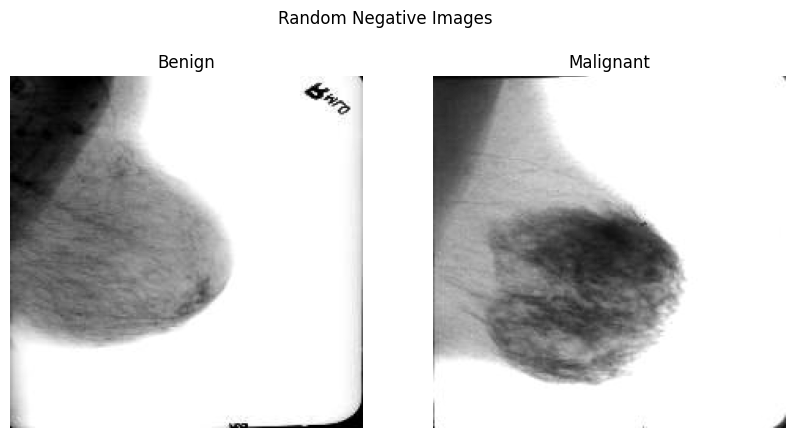

In [34]:
import random


# Function to display one random sample image from each category
def display_random_samples(output_dir, subdirs):
    plt.figure(figsize=(10, 5))
    
    for subdir in subdirs:
        current_dir = os.path.join(output_dir, subdir)
        sample_files = os.listdir(current_dir)
        
        # Select a random file from the list
        if sample_files:  # Check if there are any files
            random_file = random.choice(sample_files)
            file_path = os.path.join(current_dir, random_file)
            image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)  # Read in grayscale for display
            
            plt.subplot(1, 2, int(subdir) + 1)
            plt.imshow(image, cmap='gray')
            plt.title('Benign' if subdir == '0' else 'Malignant')
            plt.axis('off')
    
    plt.suptitle('Random Negative Images')
    plt.show()

# Display one random sample from the output directory
display_random_samples(Neg_dir, subdirs)

## **Adaptive Histogram Equalization (AHE)**


**AHE** is a powerful image enhancement technique that improves the contrast of an image by applying histogram equalization to small, localized regions (or tiles) of the image. This localized approach allows AHE to enhance the visibility of features that may be obscured by varying lighting conditions or low contrast.

Benefits in Mammography:
* **Local Contrast Enhancement**: AHE enhances the visibility of microcalcifications and other small lesions that are critical for early breast cancer detection.
* **Preservation of Brightnes**s: Unlike global histogram equalization, AHE maintains the overall brightness of the image, ensuring that the natural appearance of the mammogram is preserved while improving detail visibility.


In [35]:
pip install scikit-image

Note: you may need to restart the kernel to use updated packages.


In [36]:
import skimage
print(skimage.__version__)

0.25.1


In [37]:

from skimage import exposure

# Define the data directory and the output directory
data_dir = '/kaggle/working/merged_images'
AHE_dir = '/kaggle/working/AHistogram_Images'

# Create the output directory if it doesn't exist
os.makedirs(AHE_dir, exist_ok=True)

# Define the subdirectories for benign and malignant images
subdirs = ['0', '1']  # 0 for Benign, 1 for Malignant

# Function to apply Adaptive Histogram Equalization and save images
def apply_adaptive_histogram_equalization(data_dir, output_dir):
    for subdir in subdirs:
        # Create a corresponding subdirectory in the output directory
        os.makedirs(os.path.join(output_dir, subdir), exist_ok=True)
        
        # Define the path to the current subdirectory
        current_dir = os.path.join(data_dir, subdir)
        
        # Loop through all images in the current subdirectory
        for filename in os.listdir(current_dir):
            # Construct the full file path
            file_path = os.path.join(current_dir, filename)
            
            # Read the image
            image = cv2.imread(file_path)
            
            # Check if the image was loaded successfully
            if image is not None:
                # Convert to grayscale
                gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
                
                # Apply Adaptive Histogram Equalization
                image_adapteq = exposure.equalize_adapthist(gray_image, clip_limit=0.03)
                
                # Convert the image back to uint8 format (0-255)
                image_adapteq = (image_adapteq * 255).astype(np.uint8)
                
                # Save the equalized image in the corresponding output directory
                output_file_path = os.path.join(output_dir, subdir, filename)
                cv2.imwrite(output_file_path, image_adapteq)
            else:
                print(f"Warning: Could not read image {file_path}")

# Call the function to apply the transformation
apply_adaptive_histogram_equalization(data_dir, AHE_dir)

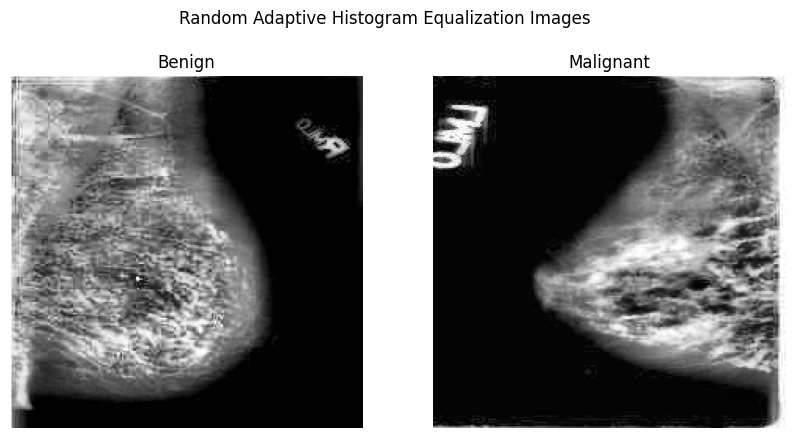

In [38]:
import random


# Function to display one random sample image from each category
def display_random_samples(output_dir, subdirs):
    plt.figure(figsize=(10, 5))
    
    for subdir in subdirs:
        current_dir = os.path.join(output_dir, subdir)
        sample_files = os.listdir(current_dir)
        
        # Select a random file from the list
        if sample_files:  # Check if there are any files
            random_file = random.choice(sample_files)
            file_path = os.path.join(current_dir, random_file)
            image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)  # Read in grayscale for display
            
            plt.subplot(1, 2, int(subdir) + 1)
            plt.imshow(image, cmap='gray')
            plt.title('Benign' if subdir == '0' else 'Malignant')
            plt.axis('off')
    
    plt.suptitle('Random Adaptive Histogram Equalization Images')
    plt.show()


# Display one random sample from the output directory
display_random_samples('/kaggle/working/AHistogram_Images', subdirs)

# **Visualization**

Display 5 images of each original image, Negative and Adaptive histogram equalization

1. **Original Image:**

These are the unaltered mammograms in their initial form, They present a grayscale representation of the breast tissue. as you see The details of the tissue structure are challenging to discern.

2. **Negative Image:**

The negative images result from inverting the pixel values of the original images. This technique inverts light and dark areas, enhancing contrast and highlighting potentially obscured details.
The results reveal a noticeable improvement in clarity, making some structures easier to identify.

3. **Adaptive Histogram Equalized Image:**

Adaptive Histogram Equalization (AHE) enhances image contrast by evenly distributing pixel intensity values. AHE is commonly used to improve the visibility of details in images with diverse brightness levels. The outcomes demonstrate that AHE significantly enhances contrast and reveals more structures. 

**Negative images** can be beneficial for visual analysis by improving the visibility of specific details.

**Adaptive histogram** equalization can significantly enhance image clarity



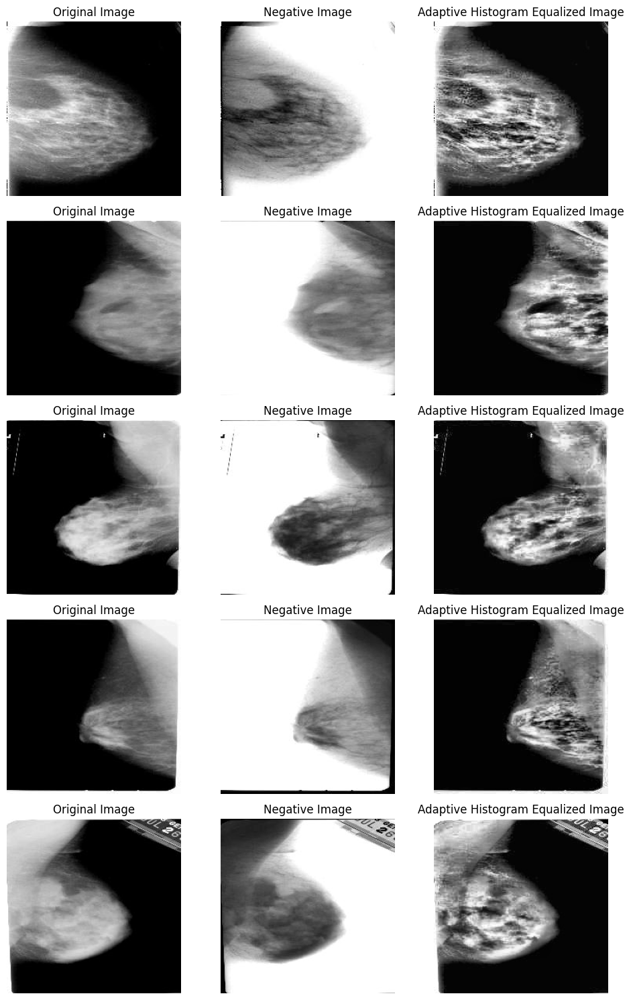

In [39]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def display_images():
    # Get the image names from the merged images directory
    image_names = [f for f in os.listdir('/kaggle/working/merged_images/1') if f.endswith(('.jpg', '.png'))][:5]

    # Create subplots for 5 images and 3 columns (original, Negative , Adaptive histogram equalized)
    fig, axs = plt.subplots(5, 3, figsize=(10, 15))

    for i, image_name in enumerate(image_names):
        # Get the full paths to the images
        image_path1 = os.path.join('/kaggle/working/merged_images/1', image_name)  # Original Image
        image_path2 = os.path.join('/kaggle/working/Negative_Images/1', image_name)  # Negative Image
        image_path3 = os.path.join('/kaggle/working/AHistogram_Images/1', image_name)  # Adaptive Histogram Equalized Image

        # Open the images
        image1 = Image.open(image_path1).convert('L')  # Convert to grayscale for original
        image2 = Image.open(image_path2)
        image3 = Image.open(image_path3)

        # Display the images in the subplots
        axs[i, 0].imshow(image1, cmap='gray')
        axs[i, 0].axis('off')
        axs[i, 0].set_title('Original Image')

        axs[i, 1].imshow(image2, cmap='gray')
        axs[i, 1].axis('off')
        axs[i, 1].set_title('Negative Image')

        axs[i, 2].imshow(image3, cmap='gray')
        axs[i, 2].axis('off')
        axs[i, 2].set_title('Adaptive Histogram Equalized Image')

    plt.tight_layout()
    plt.show()

display_images()

# **Feature Extraction**

**Feature extraction** is a vital step in the image processing pipeline, particularly in the context of medical imaging, where it plays a significant role in enhancing the performance of classification models. In the realm of breast cancer detection from mammograms, effective feature extraction techniques can significantly improve the ability of models, such as Convolutional Neural Networks (CNNs), to identify and classify cancerous tissues accurately.

In this project, each of the aforementioned feature extraction techniques **Histogram of Oriented Gradients (HOG**), **Scale-Invariant Feature Transform (SIFT)**, and **Local Binary Pattern(LBP)** has been applied to three different datasets: the original dataset, the Negative Transformer dataset, and the AHE (Adaptive Histogram Equalization) dataset. This comprehensive approach allows for a robust analysis of the extracted features, ultimately enhancing the performance of the CNN model used for breast cancer detection in mammograms.

# **Histogram of Oriented Gradients (HOG)**

HOG is a feature descriptor that captures the distribution of gradient orientations in localized portions of an image. It is particularly effective in capturing edge and shape information, which are critical for identifying structures in mammograms.

By dividing the image into small cells and computing the histogram of gradient directions for each cell, HOG provides a robust representation of the image's shape and structure. This technique is beneficial for distinguishing between benign and malignant tissues in breast cancer detection.

## **(HOG) Orignal Image**

The provided code effectively demonstrates how to apply the HOG feature extraction technique to an original dataset of mammogram images. By encapsulating the HOG processing logic within a function ***apply_hog_and_save(data_dir, output_dir)*** , the code allows for easy reuse across different datasets, facilitating a streamlined workflow for breast cancer detection tasks. This modular approach enhances the maintainability and scalability of the code, making it suitable for various datasets and applications.

In [40]:
import os
import cv2
import numpy as np
from skimage import feature

# Define the data directory and the output directory
data_dir = '/kaggle/working/merged_images'
output_dir = '/kaggle/working/Hog_Images'

# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Define the subdirectories for benign and malignant images
subdirs = ['0', '1']  # 0 for Benign, 1 for Malignant

def apply_hog_and_save(data_dir, output_dir):
    # Iterate through each subdirectory
    for subdir in subdirs:
        # Create a corresponding subdirectory in the output directory
        os.makedirs(os.path.join(output_dir, subdir), exist_ok=True)
        
        # Define the path to the current subdirectory
        current_dir = os.path.join(data_dir, subdir)
        
        # Get the list of image files in the current subdirectory
        image_files = os.listdir(current_dir)
        
        # Process each image file
        for filename in image_files:
            # Prepare the full path for the image
            file_path = os.path.join(current_dir, filename)
            output_path = os.path.join(output_dir, subdir, filename)
            
            # Read the image
            image = cv2.imread(file_path)
            
            # Check if the image was loaded successfully
            if image is not None:
                # Convert to grayscale
                gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
                
                # Compute HOG features
                hog_features, hog_image = feature.hog(
                    gray_image,
                    orientations=9,
                    pixels_per_cell=(8, 8),
                    cells_per_block=(2, 2),
                    visualize=True
                )
                
                # Scale the HOG image for better visualization
                hog_image = (hog_image * 255).astype(np.uint8)
                
                # Save the HOG image
                cv2.imwrite(output_path, hog_image)
            else:
                print(f"Warning: Could not read image {file_path}")

# Call the function to apply HOG and save images
apply_hog_and_save(data_dir, output_dir)

print("HOG features extracted and images saved successfully.")

HOG features extracted and images saved successfully.


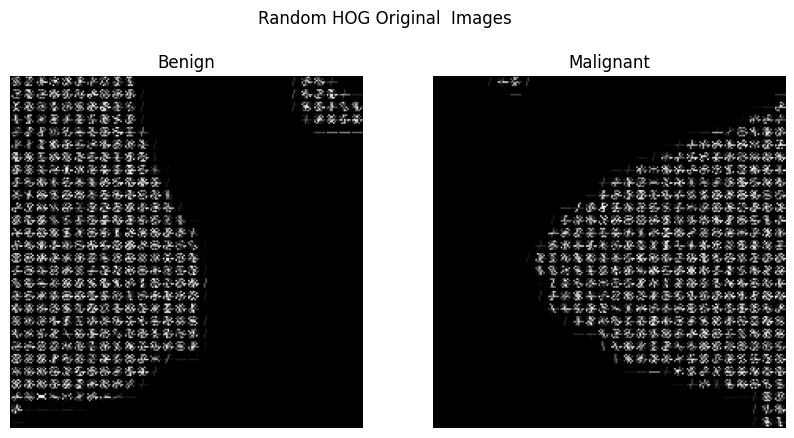

In [41]:

import random


# Function to display one random sample image from each category
def display_random_samplesHog(output_dir, subdirs):
    plt.figure(figsize=(10, 5))
    
    for subdir in subdirs:
        current_dir = os.path.join(output_dir, subdir)
        sample_files = os.listdir(current_dir)
        
        # Select a random file from the list
        if sample_files:  # Check if there are any files
            random_file = random.choice(sample_files)
            file_path = os.path.join(current_dir, random_file)
            image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)  # Read in grayscale for display
            
            plt.subplot(1, 2, int(subdir) + 1)
            plt.imshow(image, cmap='gray')
            plt.title('Benign' if subdir == '0' else 'Malignant')
            plt.axis('off')
    
    plt.suptitle('Random HOG Original  Images')
    plt.show()

subdirs = ['0', '1']

# Display one random sample from the output directory
display_random_samplesHog('/kaggle/working/Hog_Images', subdirs)

The provided code snippet demonstrates how to preprocess a dataset of HOG images for use in a Convolutional Neural Network (CNN) classifier. The code includes steps for loading the dataset, splitting it into training, validation, and testing subsets, and preparing the data for efficient training. Below is a detailed explanation of each part of the code:

In [42]:
import tensorflow as tf

# Define the data directory
data_dir = '/kaggle/working/Hog_Images'

# Create a dataset for the entire data to use for split
full_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    labels='inferred',  # Automatically infer labels from directory structure
    label_mode='categorical',  # Use categorical labels (one-hot encoding)
    image_size=(224, 224),  # Resize images to 224x224
    seed=50,  # Seed for random number generator
    shuffle=True,  # Shuffle the dataset
    batch_size=13  # Number of images to return in each batch
)

# Calculate the total number of samples
total_samples = tf.data.experimental.cardinality(full_dataset).numpy()

# Define sizes for training, validation, and test datasets
train_size = int(0.8 * total_samples)  # 80% for training
val_size = int(0.1 * total_samples)    # 10% for validation
test_size = total_samples - train_size - val_size  # Remaining 10% for testing

# Create train, validation, and test datasets
train_Neg_dataset = full_dataset.take(train_size)
validation_Neg_dataset = full_dataset.skip(train_size).take(val_size)
test_Neg_dataset = full_dataset.skip(train_size + val_size).take(test_size)

# Prefetch datasets for performance
trainHOG_original_dataset = train_Neg_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
validationHOG_original_dataset = validation_Neg_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
testHOG_original_dataset = test_Neg_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

# Print the number of samples in each dataset
print(f"Train samples:      {train_size}     batches(13) ==> {train_size * 13}")
print(f"Validation samples: {val_size}       batches(13) ==> {val_size * 13}")
print(f"Test samples:       {test_size}       batches(13) ==> {test_size * 13}")



Found 8387 files belonging to 2 classes.
Train samples:      516     batches(13) ==> 6708
Validation samples: 64       batches(13) ==> 832
Test samples:       66       batches(13) ==> 858


In [43]:

model_HOG = create_modelCNN()

Hog_Original = model_HOG.fit(
           trainHOG_original_dataset,
            validation_data= validationHOG_original_dataset, batch_size=13, 
            epochs=7       )

Epoch 1/7


I0000 00:00:1745850151.654724      99 service.cc:148] XLA service 0x7854a00127c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1745850151.660047      99 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1745850151.660068      99 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1745850152.287629      99 cuda_dnn.cc:529] Loaded cuDNN version 90300


  4/516 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - accuracy: 0.6378 - loss: 33.6214 - precision: 0.6378 - recall: 0.6378

I0000 00:00:1745850159.032239      99 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


516/516 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - accuracy: 0.5533 - loss: 2.3903 - precision: 0.5533 - recall: 0.5533 - val_accuracy: 0.6226 - val_loss: 0.6475 - val_precision: 0.6226 - val_recall: 0.6226
Epoch 2/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - accuracy: 0.6558 - loss: 0.6213 - precision: 0.6558 - recall: 0.6558 - val_accuracy: 0.6983 - val_loss: 0.5707 - val_precision: 0.6983 - val_recall: 0.6983
Epoch 3/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - accuracy: 0.7064 - loss: 0.5860 - precision: 0.7064 - recall: 0.7064 - val_accuracy: 0.7212 - val_loss: 0.5570 - val_precision: 0.7212 - val_recall: 0.7212
Epoch 4/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - accuracy: 0.7221 - loss: 0.5522 - precision: 0.7221 - recall: 0.7221 - val_accuracy: 0.7488 - val_loss: 0.5119 - val_precision: 0.7488 - val_recall: 0.7488
Epoch 5/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - accuracy: 0.7442 - loss: 0.5160 - precision: 0.7442 - recall: 0.7442 - val_accuracy: 0.7584 - val_loss: 0.5048 

In [44]:
Hog_Original_Result = model_HOG.evaluate(testHOG_original_dataset)

66/66 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.7780 - loss: 0.4391 - precision: 0.7780 - recall: 0.7780


In [45]:
model_HOG.save('/kaggle/working/models/Hog_model.h5')

## **(HOG) Negative Image**

Here we call ***apply_hog_and_save(data_dir, output_dir)*** to apply HOG on Negative Images dataset that we prepared before

In [46]:


# Define the data directory and the output directory
data_dir = '/kaggle/working/Negative_Images'
output_dir = '/kaggle/working/HogNeg_Images'

# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Call the function to apply HOG and save images
apply_hog_and_save(data_dir, output_dir)

print("HOG features extracted and images saved successfully.")

HOG features extracted and images saved successfully.


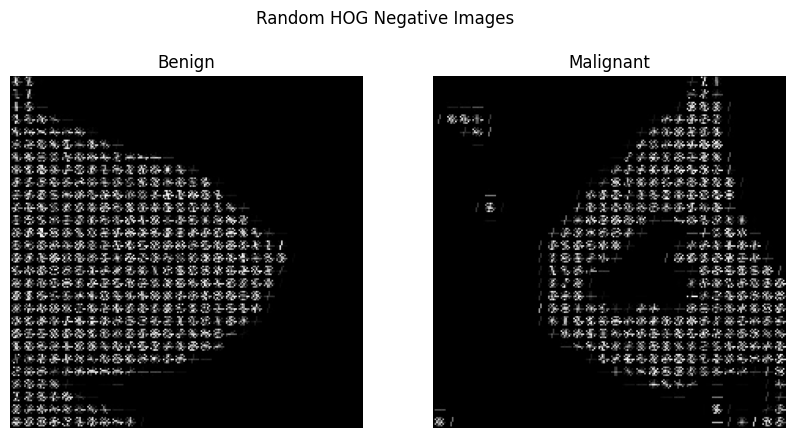

In [47]:

import random


# Function to display one random sample image from each category
def display_random_samplesHogNeg(output_dir, subdirs):
    plt.figure(figsize=(10, 5))
    
    for subdir in subdirs:
        current_dir = os.path.join(output_dir, subdir)
        sample_files = os.listdir(current_dir)
        
        # Select a random file from the list
        if sample_files:  # Check if there are any files
            random_file = random.choice(sample_files)
            file_path = os.path.join(current_dir, random_file)
            image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)  # Read in grayscale for display
            
            plt.subplot(1, 2, int(subdir) + 1)
            plt.imshow(image, cmap='gray')
            plt.title('Benign' if subdir == '0' else 'Malignant')
            plt.axis('off')
    
    plt.suptitle('Random HOG Negative Images')
    plt.show()

subdirs = ['0', '1']

# Display one random sample from the output directory
display_random_samplesHogNeg('/kaggle/working/HogNeg_Images', subdirs)

In [48]:
import tensorflow as tf

# Define the data directory
data_dir = '/kaggle/working/HogNeg_Images'

# Create a dataset for the entire data to use for split
full_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    labels='inferred',  # Automatically infer labels from directory structure
    label_mode='categorical',  # Use categorical labels (one-hot encoding)
    image_size=(224, 224),  # Resize images to 224x224
    seed=50,  # Seed for random number generator
    shuffle=True,  # Shuffle the dataset
    batch_size=13  # Number of images to return in each batch
)

# Calculate the total number of samples
total_samples = tf.data.experimental.cardinality(full_dataset).numpy()

# Define sizes for training, validation, and test datasets
train_size = int(0.8 * total_samples)  # 80% for training
val_size = int(0.1 * total_samples)    # 10% for validation
test_size = total_samples - train_size - val_size  # Remaining 10% for testing

# Create train, validation, and test datasets
train_Neg_dataset = full_dataset.take(train_size)
validation_Neg_dataset = full_dataset.skip(train_size).take(val_size)
test_Neg_dataset = full_dataset.skip(train_size + val_size).take(test_size)

# Prefetch datasets for performance
trainHOG_Neg_dataset = train_Neg_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
validationHOG_Neg_dataset = validation_Neg_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
testHOG_Neg_dataset = test_Neg_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

# Print the number of samples in each dataset
print(f"Train samples:      {train_size}     batches(13) ==> {train_size * 13}")
print(f"Validation samples: {val_size}       batches(13) ==> {val_size * 13}")
print(f"Test samples:       {test_size}       batches(13) ==> {test_size * 13}")



Found 8387 files belonging to 2 classes.
Train samples:      516     batches(13) ==> 6708
Validation samples: 64       batches(13) ==> 832
Test samples:       66       batches(13) ==> 858


In [49]:

model_HOG_Neg = create_modelCNN()

Hog_Neg = model_HOG_Neg.fit(
            trainHOG_Neg_dataset,
            validation_data= validationHOG_Neg_dataset, batch_size=13, 
            epochs=7
        )

Epoch 1/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - accuracy: 0.5638 - loss: 3.6639 - precision: 0.5638 - recall: 0.5638 - val_accuracy: 0.6755 - val_loss: 0.6016 - val_precision: 0.6755 - val_recall: 0.6755
Epoch 2/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - accuracy: 0.6566 - loss: 0.6250 - precision: 0.6566 - recall: 0.6566 - val_accuracy: 0.6923 - val_loss: 0.5746 - val_precision: 0.6923 - val_recall: 0.6923
Epoch 3/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - accuracy: 0.6954 - loss: 0.5928 - precision: 0.6954 - recall: 0.6954 - val_accuracy: 0.6971 - val_loss: 0.6216 - val_precision: 0.6971 - val_recall: 0.6971
Epoch 4/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - accuracy: 0.7155 - loss: 0.5521 - precision: 0.7155 - recall: 0.7155 - val_accuracy: 0.7560 - val_loss: 0.4924 - val_precision: 0.7560 - val_recall: 0.7560
Epoch 5/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - accuracy: 0.7297 - loss: 0.5273 - precision: 0.7297 - recall: 0.7297 - val_accuracy: 0.7488 - val_los

In [50]:
Hog_Neg_Result = model_HOG_Neg.evaluate(testHOG_Neg_dataset)

66/66 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.7954 - loss: 0.4392 - precision: 0.7954 - recall: 0.7954


In [51]:
model_HOG_Neg.save('/kaggle/working/models/HogN_model.h5')

## **(HOG) AHE image**


Here we call ***apply_hog_and_save(data_dir, output_dir)*** to apply HOG on AHE Images dataset that we prepared before, and display some random images that has been applied HOG on it 

In [52]:

# Define the data directory and the output directory
data_dir = '/kaggle/working/AHistogram_Images'
output_dir = '/kaggle/working/HogAHE_Images'

# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Call the function to apply HOG and save images
apply_hog_and_save(data_dir, output_dir)

print("HOG features extracted and images saved successfully")

HOG features extracted and images saved successfully


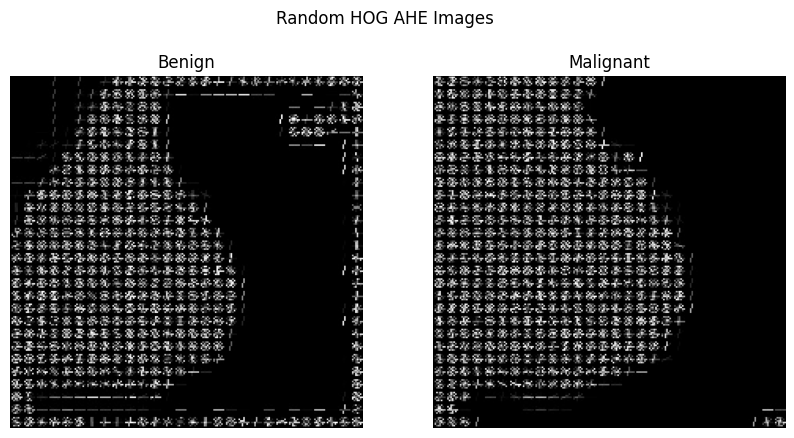

In [53]:
import random


# Function to display one random sample image from each category
def display_random_samplesHogNeg(output_dir, subdirs):
    plt.figure(figsize=(10, 5))
    
    for subdir in subdirs:
        current_dir = os.path.join(output_dir, subdir)
        sample_files = os.listdir(current_dir)
        
        # Select a random file from the list
        if sample_files:  # Check if there are any files
            random_file = random.choice(sample_files)
            file_path = os.path.join(current_dir, random_file)
            image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)  # Read in grayscale for display
            
            plt.subplot(1, 2, int(subdir) + 1)
            plt.imshow(image, cmap='gray')
            plt.title('Benign' if subdir == '0' else 'Malignant')
            plt.axis('off')
    
    plt.suptitle('Random HOG AHE Images')
    plt.show()

subdirs = ['0', '1']

# Display one random sample from the output directory
display_random_samplesHogNeg('/kaggle/working/HogAHE_Images', subdirs)

In [54]:
import tensorflow as tf

# Define the data directory
data_dir = '/kaggle/working/HogAHE_Images'

# Create a dataset for the entire data to use for split
full_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    labels='inferred',  # Automatically infer labels from directory structure
    label_mode='categorical',  # Use categorical labels (one-hot encoding)
    image_size=(224, 224),  # Resize images to 224x224
    seed=50,  # Seed for random number generator
    shuffle=True,  # Shuffle the dataset
    batch_size=13  # Number of images to return in each batch
)

# Calculate the total number of samples
total_samples = tf.data.experimental.cardinality(full_dataset).numpy()

# Define sizes for training, validation, and test datasets
train_size = int(0.8 * total_samples)  # 80% for training
val_size = int(0.1 * total_samples)    # 10% for validation
test_size = total_samples - train_size - val_size  # Remaining 10% for testing

# Create train, validation, and test datasets
train_AHE_dataset = full_dataset.take(train_size)
validation_AHE_dataset = full_dataset.skip(train_size).take(val_size)
test_AHE_dataset = full_dataset.skip(train_size + val_size).take(test_size)

# Prefetch datasets for performance
trainHOG_AHE_dataset = train_AHE_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
validationHOG_AHE_dataset = validation_AHE_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
testHOG_AHE_dataset = test_AHE_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

# Print the number of samples in each dataset
print(f"Train samples:      {train_size}     batches(13) ==> {train_size * 13}")
print(f"Validation samples: {val_size}       batches(13) ==> {val_size * 13}")
print(f"Test samples:       {test_size}       batches(13) ==> {test_size * 13}")



Found 8387 files belonging to 2 classes.
Train samples:      516     batches(13) ==> 6708
Validation samples: 64       batches(13) ==> 832
Test samples:       66       batches(13) ==> 858


In [55]:

model_HOG_AHE = create_modelCNN()

Hog_AHE = model_HOG_AHE.fit(
            trainHOG_AHE_dataset,
            validation_data= validationHOG_AHE_dataset,
            batch_size= 13,
            epochs=7
        )

Epoch 1/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - accuracy: 0.5624 - loss: 3.1651 - precision: 0.5624 - recall: 0.5624 - val_accuracy: 0.6827 - val_loss: 0.5962 - val_precision: 0.6827 - val_recall: 0.6827
Epoch 2/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - accuracy: 0.6611 - loss: 0.6243 - precision: 0.6611 - recall: 0.6611 - val_accuracy: 0.6899 - val_loss: 0.5811 - val_precision: 0.6899 - val_recall: 0.6899
Epoch 3/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - accuracy: 0.6875 - loss: 0.5893 - precision: 0.6875 - recall: 0.6875 - val_accuracy: 0.7296 - val_loss: 0.5396 - val_precision: 0.7296 - val_recall: 0.7296
Epoch 4/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - accuracy: 0.7037 - loss: 0.5589 - precision: 0.7037 - recall: 0.7037 - val_accuracy: 0.7332 - val_loss: 0.4974 - val_precision: 0.7332 - val_recall: 0.7332
Epoch 5/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - accuracy: 0.7441 - loss: 0.5254 - precision: 0.7441 - recall: 0.7441 - val_accuracy: 0.7560 - val_los

In [56]:
Hog_AHE_Result = model_HOG_AHE.evaluate(testHOG_AHE_dataset)

66/66 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.7922 - loss: 0.4435 - precision: 0.7922 - recall: 0.7922


In [57]:
model_HOG_AHE.save('/kaggle/working/models/HogAHE_model.h5')

## Comparative Analysis (HOG)


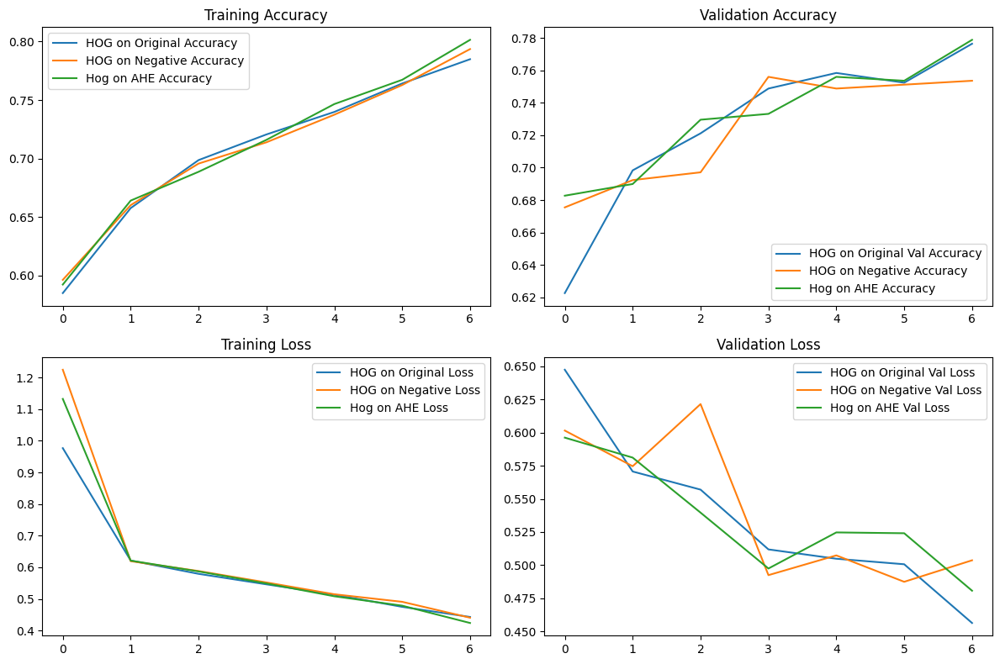

In [58]:
import matplotlib.pyplot as plt

# Plot accuracy comparison
plt.figure(figsize=(12, 8))

# Accuracy
plt.subplot(2, 2, 1)
plt.plot(Hog_Original.history['accuracy'], label='HOG on Original Accuracy')
plt.plot(Hog_Neg.history['accuracy'], label='HOG on Negative Accuracy')
plt.plot(Hog_AHE.history['accuracy'], label='Hog on AHE Accuracy')
plt.title('Training Accuracy')
plt.legend()

# Validation Accuracy
plt.subplot(2, 2, 2)
plt.plot(Hog_Original.history['val_accuracy'], label='HOG on Original Val Accuracy')
plt.plot(Hog_Neg.history['val_accuracy'], label='HOG on Negative Accuracy')
plt.plot(Hog_AHE.history['val_accuracy'], label='Hog on AHE Accuracy')
plt.title('Validation Accuracy')
plt.legend()

# Loss
plt.subplot(2, 2, 3)
plt.plot(Hog_Original.history['loss'], label='HOG on Original Loss')
plt.plot(Hog_Neg.history['loss'], label='HOG on Negative Loss')
plt.plot(Hog_AHE.history['loss'], label='Hog on AHE Loss')
plt.title('Training Loss')
plt.legend()

# Validation Loss
plt.subplot(2, 2, 4)
plt.plot(Hog_Original.history['val_loss'], label='HOG on Original Val Loss')
plt.plot(Hog_Neg.history['val_loss'], label='HOG on Negative Val Loss')
plt.plot(Hog_AHE.history['val_loss'], label='Hog on AHE Val Loss')
plt.title('Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

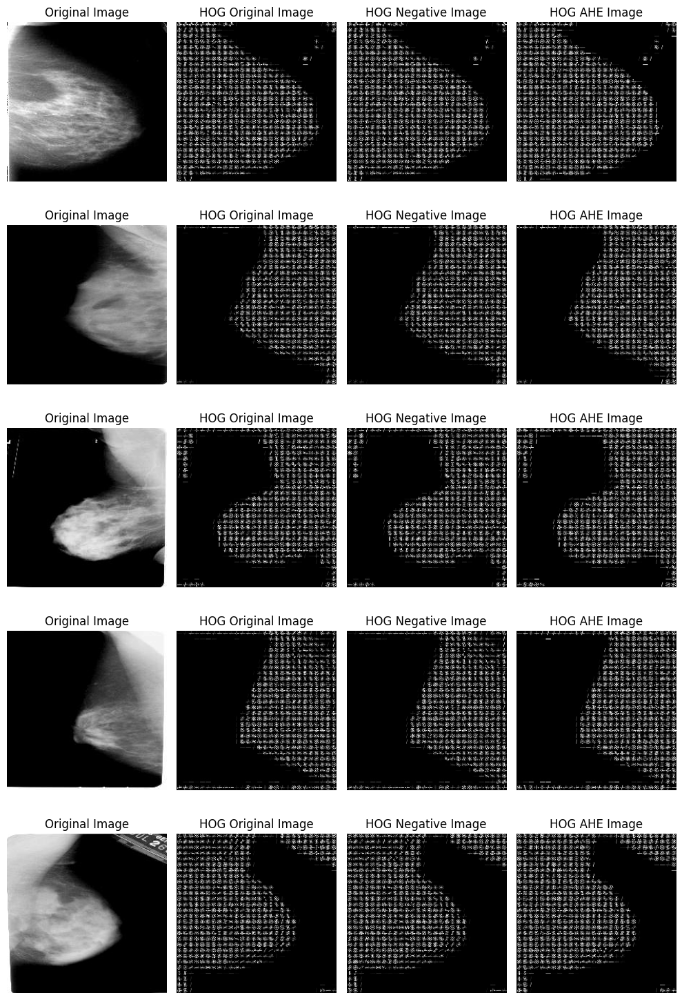

In [59]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def display_images():
    # Get the image names from the merged images directory
    image_names = [f for f in os.listdir('/kaggle/working/merged_images/1') if f.endswith(('.jpg', '.png'))][:5]

    # Create subplots for 5 images and 4 columns (original, Negative , Adaptive histogram equalized)
    fig, axs = plt.subplots(5, 4, figsize=(10, 15))

    for i, image_name in enumerate(image_names):
        # Get the full paths to the images
        image_path1 = os.path.join('/kaggle/working/merged_images/1', image_name)  # Original Image
        image_path2 = os.path.join('/kaggle/working/Hog_Images/1', image_name)  # Hog Image
        image_path3 = os.path.join('/kaggle/working/HogNeg_Images/1', image_name)  # Hog Negative Image
        image_path4 = os.path.join('/kaggle/working/HogAHE_Images/1', image_name)  # HOG Adaptive Histogram Equalized Image

        # Open the images
        image1 = Image.open(image_path1).convert('L')  # Convert to grayscale for original
        image2 = Image.open(image_path2)
        image3 = Image.open(image_path3)
        image4 = Image.open(image_path4)
        
        # Display the images in the subplots
        axs[i, 0].imshow(image1, cmap='gray')
        axs[i, 0].axis('off')
        axs[i, 0].set_title('Original Image')
       
        axs[i, 1].imshow(image2, cmap='gray')
        axs[i, 1].axis('off')
        axs[i, 1].set_title('HOG Original Image')
        
        axs[i, 2].imshow(image3, cmap='gray')
        axs[i, 2].axis('off')
        axs[i, 2].set_title('HOG Negative Image')

        axs[i, 3].imshow(image4, cmap='gray')
        axs[i, 3].axis('off')
        axs[i, 3].set_title('HOG AHE Image')

    plt.tight_layout()
    plt.show()

display_images()

In [ ]:
import pandas as pd
from tabulate import tabulate

accuracy = [Hog_Original_Result[1], Hog_Neg_Result[1], Hog_AHE_Result[1]]
precision = [Hog_Original_Result[2], Hog_Neg_Result[2], Hog_AHE_Result[2]]
recall = [Hog_Original_Result[3], Hog_Neg_Result[3], Hog_AHE_Result[3]]


data = {
    "Features": ["Histogram of Oriented Gradients (HOG)", "Histogram of Oriented Gradients (HOG)", "Histogram of Oriented Gradients (HOG)"],
    "Image Enhancement": ["Original Image", "Negative Transformer", "Adaptive Histogram Equalization"],
    "Accuracy": accuracy,
    "Precision": precision,
    "Recall": recall
}

df = pd.DataFrame(data)

print("\n---------------------------------------------------------------------------------------------------------\n")
print(tabulate(df, headers='keys', showindex=False))


---------------------------------------------------------------------------------------------------------

Features                               Image Enhancement                  Accuracy    Precision    Recall
-------------------------------------  -------------------------------  ----------  -----------  --------
Histogram of Oriented Gradients (HOG)  Original Image                     0.787485     0.787485  0.787485
Histogram of Oriented Gradients (HOG)  Negative Transformer               0.775679     0.775679  0.775679
Histogram of Oriented Gradients (HOG)  Adaptive Histogram Equalization    0.783943     0.783943  0.783943


The Histogram of Oriented Gradients (HOG) feature extraction results before and after image enhancement exhibit significant variations in feature representation and classification performance. Original HOG Processing retains clear edge structures with moderate contrast, allowing for effective shape representation and stable performance, achieving a final validation accuracy of approximately 77%. Negative Transformation, however, alters intensity values, which affects feature extraction negatively, leading to lower validation accuracy ~55% and consistently high validation loss. The extracted features in negative-transformed images lack consistency, making them less effective for classification. Conversely, Adaptive Histogram Equalization (AHE) enhances contrast and texture visibility, improving feature extraction while maintaining stable accuracy ~76%. However, AHE introduces additional noise, causing fluctuations in validation loss, as seen in the performance graphs. The image grids and HOG feature maps demonstrate that AHE enhances feature clarity, detecting more structural details, whereas Negative Transformation distorts crucial edge-based features. While AHE helps in identifying more detailed features, excessive enhancement can introduce artifacts that negatively impact classification. These observations emphasize that AHE is beneficial in certain cases, but uncontrolled contrast enhancement can degrade reliability, whereas Negative Transformation significantly reduces the effectiveness of HOG. The performance metrics and visual analysis highlight the importance of selecting the right preprocessing technique to optimize HOG-based feature extraction and improve classification robustness.


The **table displays** the performance of a model using Histogram of Oriented Gradients (HOG) features for image classification. It shows how the model performs with different image enhancement techniques: 

Findings:

* Best Performance: Negative Transformer achieved the highest accuracy, precision, and recall.
  
* original image (without enhancement): While it had some impact, it didn't improve performance over the original image.
  
* Adaptive Histogram Equalization: This technique lowered performance compared to the original image.

The Negative Transformer and The original image appears to be the best option for this model and HOG features in this context. adaptive histogram equalization techniques did not lead to improvements.

# **Scale Invariant Feature Transform (SIFT)**

**Scale Invariant Feature Transform (SIFT)** is a feature detection and description algorithm developed by David Lowe in 1999. It is widely used in computer vision for object recognition, image stitching, and 3D modeling due to its robustness to changes in scale, rotation, and illumination. Here’s a brief overview of its theoretical background:

Key Concepts of SIFT:

* Scale Space Extrema Detection:

SIFT identifies keypoints in an image by searching for local extrema in a scale space, which is generated by applying Gaussian blurring at different scales. This allows SIFT to detect features that are invariant to scale changes.

* Keypoint Localization:

Once potential keypoints are identified, SIFT refines their locations by eliminating low-contrast keypoints and those that are poorly localized along edges. This step ensures that only the most stable keypoints are retained.

* Orientation Assignment:

Each keypoint is assigned a consistent orientation based on the local image gradient directions. This orientation assignment makes the keypoints invariant to rotation, allowing for more robust matching across different views of the same object.

* Keypoint Descriptor:

For each keypoint, SIFT computes a descriptor that captures the local image gradients around the keypoint. This descriptor is typically represented as a 128-dimensional vector, which encodes the distribution of gradient orientations in the vicinity of the keypoint.

* Matching Keypoints:

SIFT descriptors can be used to match keypoints between different images. The matching process often involves calculating the Euclidean distance between descriptors and applying techniques like nearest neighbor matching.
Impact of SIFT on Breast Cancer Detection in Mammograms

**SIFT can play a significant role in breast cancer detection in mammograms** by enhancing the analysis of mammographic images. Here’s how SIFT contributes to this field:

* Feature Extraction:

SIFT effectively extracts distinctive features from mammograms, such as microcalcifications and masses, which are critical indicators of breast cancer. These features can be used to differentiate between benign and malignant lesions.

* Robustness to Variations:

The scale and rotation invariance of SIFT allows it to detect features consistently across different mammographic views and varying patient conditions. This robustness is essential for accurate diagnosis, as mammograms can vary in quality and orientation.

* Improved Classification:

By using SIFT features as input for machine learning classifiers, the classification performance for detecting breast cancer can be significantly improved. The rich feature representation provided by SIFT enhances the ability to distinguish between normal and abnormal tissues.


finally, The keypoints and descriptors generated by SIFT can help radiologists visualize and interpret the features of interest in mammograms, aiding in the decision-making process for diagnosis.


## (SIFT) Original image

In [61]:
import os
import cv2
import numpy as np

def apply_sift_and_save(data_dir, output_dir):
    # Create the output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    # Loop through the subdirectories (0 and 1)
    for subdir in ['0', '1']:
        # Create a corresponding subdirectory in the output directory
        os.makedirs(os.path.join(output_dir, subdir), exist_ok=True)
        
        # Define the path to the current subdirectory
        current_dir = os.path.join(data_dir, subdir)
        
        # Loop through all images in the current subdirectory
        for filename in os.listdir(current_dir):
            # Construct the full file path
            file_path = os.path.join(current_dir, filename)
            
            # Read the image
            image = cv2.imread(file_path)
            
            # Check if the image was loaded successfully
            if image is not None:
                # Convert to grayscale
                gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
                
                # Initialize SIFT detector
                sift = cv2.SIFT_create()
                
                # Detect keypoints and compute descriptors
                keypoints, descriptors = sift.detectAndCompute(gray_image, None)
                
                # Draw keypoints on the image
                sift_image = cv2.drawKeypoints(gray_image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
                
                # Save the SIFT image in the corresponding output directory
                output_file_path = os.path.join(output_dir, subdir, filename)
                cv2.imwrite(output_file_path, sift_image)
                
            else:
                print(f"Warning: Could not read image {file_path}")


In [62]:
# Example usage
data_dir = '/kaggle/working/merged_images'
output_dir = '/kaggle/working/SIFT_Images'
# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

apply_sift_and_save(data_dir, output_dir)

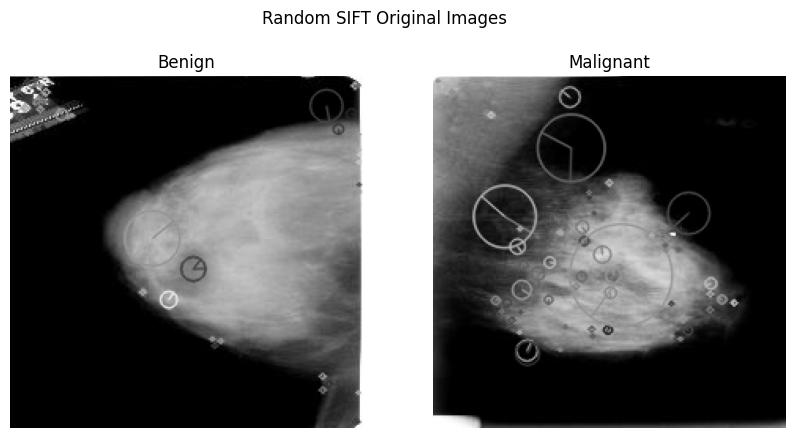

In [63]:
import random


# Function to display one random sample image from each category
def display_random_samplesSIFT(output_dir, subdirs):
    plt.figure(figsize=(10, 5))
    
    for subdir in subdirs:
        current_dir = os.path.join(output_dir, subdir)
        sample_files = os.listdir(current_dir)
        
        # Select a random file from the list
        if sample_files:  # Check if there are any files
            random_file = random.choice(sample_files)
            file_path = os.path.join(current_dir, random_file)
            image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)  # Read in grayscale for display
            
            plt.subplot(1, 2, int(subdir) + 1)
            plt.imshow(image, cmap='gray')
            plt.title('Benign' if subdir == '0' else 'Malignant')
            plt.axis('off')
    
    plt.suptitle('Random SIFT Original Images')
    plt.show()

subdirs = ['0', '1']

# Display one random sample from the output directory
display_random_samplesSIFT('/kaggle/working/SIFT_Images', subdirs)

In [ ]:

import tensorflow as tf

# Define the data directory
data_dir = '/kaggle/working/SIFT_Images'

# Create a dataset for the entire data to use for split
full_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    labels='inferred',  # Automatically infer labels from directory structure
    label_mode='categorical',  # Use categorical labels (one-hot encoding)
    image_size=(224, 224),  # Resize images to 224x224
    seed=50,  # Seed for random number generator
    shuffle=True,  # Shuffle the dataset
    batch_size=13  # Number of images to return in each batch
)

# Calculate the total number of samples
total_samples = tf.data.experimental.cardinality(full_dataset).numpy()

# Define sizes for training, validation, and test datasets
train_size = int(0.8 * total_samples)  # 80% for training
val_size = int(0.1 * total_samples)    # 10% for validation
test_size = total_samples - train_size - val_size  # Remaining 10% for testing

# Create train, validation, and test datasets
train_dataset = full_dataset.take(train_size)
validation_dataset = full_dataset.skip(train_size).take(val_size)
test_dataset = full_dataset.skip(train_size + val_size).take(test_size)

# Prefetch datasets for performance
trainSIFT_Orignal_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
validationSIFT_Orignal_dataset = validation_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
testSIFT_Orignal_dataset = test_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

# Print the number of samples in each dataset
print(f"Train samples:      {train_size}     batches(13) ==> {train_size * 13}")
print(f"Validation samples: {val_size}       batches(13) ==> {val_size * 13}")
print(f"Test samples:       {test_size}       batches(13) ==> {test_size * 13}")


Found 8387 files belonging to 2 classes.
Train samples:      516     batches(13) ==> 6708
Validation samples: 64       batches(13) ==> 832
Test samples:       66       batches(13) ==> 858


In [65]:

model_SIFT = create_modelCNN()

SIFT = model_SIFT.fit(
            trainSIFT_Orignal_dataset,
            validation_data= validationSIFT_Orignal_dataset,
            batch_size= 13,
            epochs=7
        )

Epoch 1/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - accuracy: 0.5420 - loss: 2.0212 - precision: 0.5420 - recall: 0.5420 - val_accuracy: 0.6226 - val_loss: 0.6467 - val_precision: 0.6226 - val_recall: 0.6226
Epoch 2/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - accuracy: 0.6505 - loss: 0.6413 - precision: 0.6505 - recall: 0.6505 - val_accuracy: 0.6695 - val_loss: 0.5999 - val_precision: 0.6695 - val_recall: 0.6695
Epoch 3/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - accuracy: 0.6844 - loss: 0.6021 - precision: 0.6844 - recall: 0.6844 - val_accuracy: 0.7007 - val_loss: 0.6126 - val_precision: 0.7007 - val_recall: 0.7007
Epoch 4/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - accuracy: 0.7172 - loss: 0.5532 - precision: 0.7172 - recall: 0.7172 - val_accuracy: 0.7488 - val_loss: 0.5069 - val_precision: 0.7488 - val_recall: 0.7488
Epoch 5/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - accuracy: 0.7427 - loss: 0.5131 - precision: 0.7427 - recall: 0.7427 - val_accuracy: 0.7536 - val_los

In [66]:
SIFT_Original_Result = model_SIFT.evaluate(testSIFT_Orignal_dataset)

66/66 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7941 - loss: 0.4182 - precision: 0.7941 - recall: 0.7941


In [67]:
model_SIFT.save('/kaggle/working/models/Sift_model.h5')

## (SIFT) Negative Image

In [68]:
# Example usage
data_dir = '/kaggle/working/Negative_Images'
output_dir = '/kaggle/working/SiftNeg_Images'
# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

apply_sift_and_save(data_dir, output_dir)

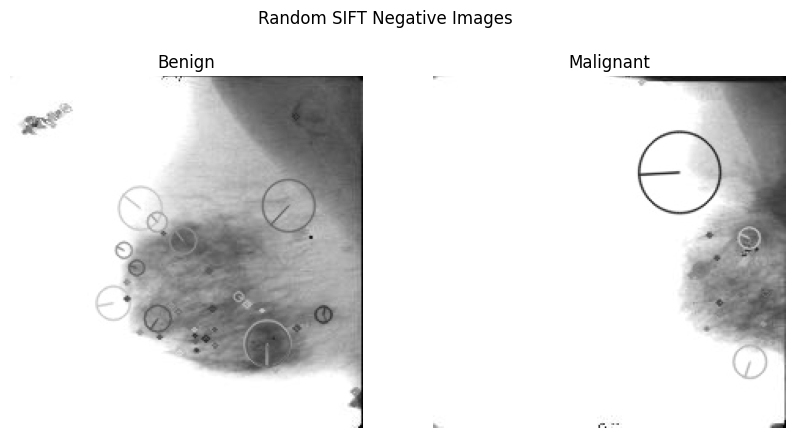

In [69]:
import random


# Function to display one random sample image from each category
def display_random_samplesSIFT(output_dir, subdirs):
    plt.figure(figsize=(10, 5))
    
    for subdir in subdirs:
        current_dir = os.path.join(output_dir, subdir)
        sample_files = os.listdir(current_dir)
        
        # Select a random file from the list
        if sample_files:  # Check if there are any files
            random_file = random.choice(sample_files)
            file_path = os.path.join(current_dir, random_file)
            image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)  # Read in grayscale for display
            
            plt.subplot(1, 2, int(subdir) + 1)
            plt.imshow(image, cmap='gray')
            plt.title('Benign' if subdir == '0' else 'Malignant')
            plt.axis('off')
    
    plt.suptitle('Random SIFT Negative Images')
    plt.show()

subdirs = ['0', '1']

# Display one random sample from the output directory
display_random_samplesSIFT('/kaggle/working/SiftNeg_Images', subdirs)

In [70]:
import tensorflow as tf

# Define the data directory
data_dir = '/kaggle/working/SiftNeg_Images'

# Create a dataset for the entire data to use for split
full_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    labels='inferred',  # Automatically infer labels from directory structure
    label_mode='categorical',  # Use categorical labels (one-hot encoding)
    image_size=(224, 224),  # Resize images to 224x224
    seed=50,  # Seed for random number generator
    shuffle=True,  # Shuffle the dataset
    batch_size=13  # Number of images to return in each batch
)

# Calculate the total number of samples
total_samples = tf.data.experimental.cardinality(full_dataset).numpy()

# Define sizes for training, validation, and test datasets
train_size = int(0.8 * total_samples)  # 80% for training
val_size = int(0.1 * total_samples)    # 10% for validation
test_size = total_samples - train_size - val_size  # Remaining 10% for testing

# Create train, validation, and test datasets
train_dataset = full_dataset.take(train_size)
validation_dataset = full_dataset.skip(train_size).take(val_size)
test_dataset = full_dataset.skip(train_size + val_size).take(test_size)

# Prefetch datasets for performance
trainSIFT_Neg_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
validationSIFT_Neg_dataset = validation_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
testSIFT_Neg_dataset = test_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

# Print the number of samples in each dataset
print(f"Train samples:      {train_size}     batches(13) ==> {train_size * 13}")
print(f"Validation samples: {val_size}       batches(13) ==> {val_size * 13}")
print(f"Test samples:       {test_size}       batches(13) ==> {test_size * 13}")



Found 8387 files belonging to 2 classes.
Train samples:      516     batches(13) ==> 6708
Validation samples: 64       batches(13) ==> 832
Test samples:       66       batches(13) ==> 858


In [71]:

model_SIFT_Neg = create_modelCNN()

SIFT_Neg = model_SIFT_Neg.fit(
            trainSIFT_Neg_dataset,
            validation_data= validationSIFT_Neg_dataset,
            batch_size= 13,
            epochs=7
        )

Epoch 1/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - accuracy: 0.5120 - loss: 3.0335 - precision: 0.5120 - recall: 0.5120 - val_accuracy: 0.5228 - val_loss: 0.6748 - val_precision: 0.5228 - val_recall: 0.5228
Epoch 2/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - accuracy: 0.5276 - loss: 0.6855 - precision: 0.5276 - recall: 0.5276 - val_accuracy: 0.5577 - val_loss: 0.6712 - val_precision: 0.5577 - val_recall: 0.5577
Epoch 3/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - accuracy: 0.5415 - loss: 0.6794 - precision: 0.5415 - recall: 0.5415 - val_accuracy: 0.5312 - val_loss: 0.6760 - val_precision: 0.5312 - val_recall: 0.5312
Epoch 4/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - accuracy: 0.5258 - loss: 0.6817 - precision: 0.5258 - recall: 0.5258 - val_accuracy: 0.5457 - val_loss: 0.6632 - val_precision: 0.5457 - val_recall: 0.5457
Epoch 5/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - accuracy: 0.5749 - loss: 0.6697 - precision: 0.5749 - recall: 0.5749 - val_accuracy: 0.5421 - val_los

In [72]:
SIFT_Neg_Result = model_SIFT_Neg.evaluate(testSIFT_Neg_dataset)

66/66 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.7107 - loss: 0.5962 - precision: 0.7107 - recall: 0.7107


In [73]:
model_SIFT_Neg.save('/kaggle/working/models/SiftN_model.h5')

## (SIFT) AHE image 

In [74]:
# Example usage
data_dir = '/kaggle/working/AHistogram_Images'
output_dir = '/kaggle/working/SiftAHE_Images'
# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

apply_sift_and_save(data_dir, output_dir)

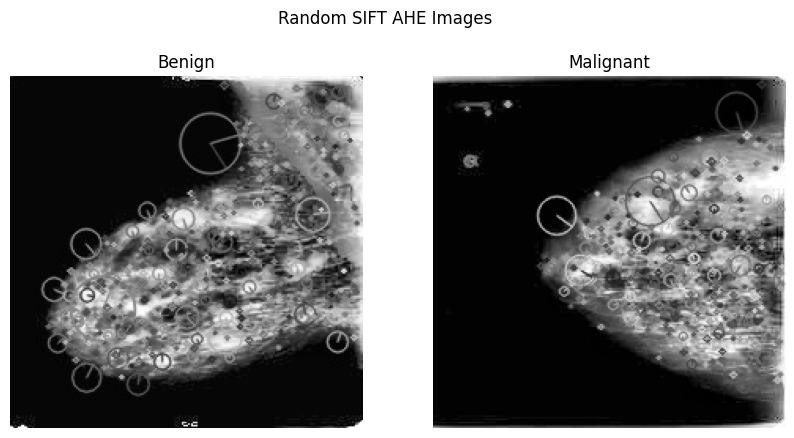

In [75]:
import random


# Function to display one random sample image from each category
def display_random_samplesSIFT(output_dir, subdirs):
    plt.figure(figsize=(10, 5))
    
    for subdir in subdirs:
        current_dir = os.path.join(output_dir, subdir)
        sample_files = os.listdir(current_dir)
        
        # Select a random file from the list
        if sample_files:  # Check if there are any files
            random_file = random.choice(sample_files)
            file_path = os.path.join(current_dir, random_file)
            image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)  # Read in grayscale for display
            
            plt.subplot(1, 2, int(subdir) + 1)
            plt.imshow(image, cmap='gray')
            plt.title('Benign' if subdir == '0' else 'Malignant')
            plt.axis('off')
    
    plt.suptitle('Random SIFT AHE Images')
    plt.show()

subdirs = ['0', '1']

# Display one random sample from the output directory
display_random_samplesSIFT('/kaggle/working/SiftAHE_Images', subdirs)

In [76]:
import tensorflow as tf

# Define the data directory
data_dir = '/kaggle/working/SiftAHE_Images'

# Create a dataset for the entire data to use for split
full_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    labels='inferred',  # Automatically infer labels from directory structure
    label_mode='categorical',  # Use categorical labels (one-hot encoding)
    image_size=(224, 224),  # Resize images to 224x224
    seed=50,  # Seed for random number generator
    shuffle=True,  # Shuffle the dataset
    batch_size=13  # Number of images to return in each batch
)

# Calculate the total number of samples
total_samples = tf.data.experimental.cardinality(full_dataset).numpy()

# Define sizes for training, validation, and test datasets
train_size = int(0.8 * total_samples)  # 80% for training
val_size = int(0.1 * total_samples)    # 10% for validation
test_size = total_samples - train_size - val_size  # Remaining 10% for testing

# Create train, validation, and test datasets
train_dataset = full_dataset.take(train_size)
validation_dataset = full_dataset.skip(train_size).take(val_size)
test_dataset = full_dataset.skip(train_size + val_size).take(test_size)

# Prefetch datasets for performance
trainSIFT_AHE_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
validationSIFT_AHE_dataset = validation_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
testSIFT_AHE_dataset = test_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

# Print the number of samples in each dataset
print(f"Train samples:      {train_size}     batches(13) ==> {train_size * 13}")
print(f"Validation samples: {val_size}       batches(13) ==> {val_size * 13}")
print(f"Test samples:       {test_size}       batches(13) ==> {test_size * 13}")



Found 8387 files belonging to 2 classes.
Train samples:      516     batches(13) ==> 6708
Validation samples: 64       batches(13) ==> 832
Test samples:       66       batches(13) ==> 858


In [77]:
model_SIFT_AHE = create_modelCNN()

SIFT_AHE = model_SIFT_AHE.fit(
            trainSIFT_AHE_dataset,
            validation_data= validationSIFT_AHE_dataset,
            batch_size= 13,
            epochs=7
        )

Epoch 1/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - accuracy: 0.5442 - loss: 2.3988 - precision: 0.5442 - recall: 0.5442 - val_accuracy: 0.6394 - val_loss: 0.6380 - val_precision: 0.6394 - val_recall: 0.6394
Epoch 2/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - accuracy: 0.6420 - loss: 0.6461 - precision: 0.6420 - recall: 0.6420 - val_accuracy: 0.6286 - val_loss: 0.6506 - val_precision: 0.6286 - val_recall: 0.6286
Epoch 3/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - accuracy: 0.6730 - loss: 0.6179 - precision: 0.6730 - recall: 0.6730 - val_accuracy: 0.6911 - val_loss: 0.5722 - val_precision: 0.6911 - val_recall: 0.6911
Epoch 4/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - accuracy: 0.7015 - loss: 0.5768 - precision: 0.7015 - recall: 0.7015 - val_accuracy: 0.7224 - val_loss: 0.5348 - val_precision: 0.7224 - val_recall: 0.7224
Epoch 5/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - accuracy: 0.7273 - loss: 0.5549 - precision: 0.7273 - recall: 0.7273 - val_accuracy: 0.7488 - val_los

In [78]:
SIFT_AHE_Result = model_SIFT_AHE.evaluate(testSIFT_AHE_dataset)

66/66 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.7829 - loss: 0.4420 - precision: 0.7829 - recall: 0.7829


In [79]:
model_SIFT_AHE.save('/kaggle/working/models/SiftAHE_model.h5')

## Comparative Analysis (SIFT)

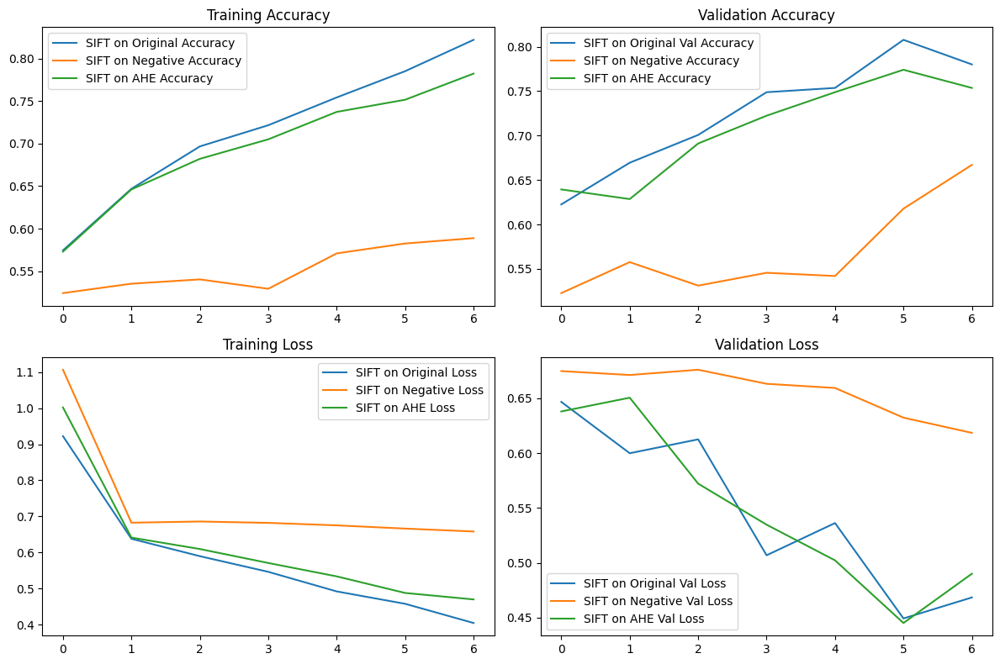

In [80]:
import matplotlib.pyplot as plt

# Plot accuracy comparison
plt.figure(figsize=(12, 8))

# Accuracy
plt.subplot(2, 2, 1)
plt.plot(SIFT.history['accuracy'], label='SIFT on Original Accuracy')
plt.plot(SIFT_Neg.history['accuracy'], label='SIFT on Negative Accuracy')
plt.plot(SIFT_AHE.history['accuracy'], label='SIFT on AHE Accuracy')
plt.title('Training Accuracy')
plt.legend()

# Validation Accuracy
plt.subplot(2, 2, 2)
plt.plot(SIFT.history['val_accuracy'], label='SIFT on Original Val Accuracy')
plt.plot(SIFT_Neg.history['val_accuracy'], label='SIFT on Negative Accuracy')
plt.plot(SIFT_AHE.history['val_accuracy'], label='SIFT on AHE Accuracy')
plt.title('Validation Accuracy')
plt.legend()

# Loss
plt.subplot(2, 2, 3)
plt.plot(SIFT.history['loss'], label='SIFT on Original Loss')
plt.plot(SIFT_Neg.history['loss'], label='SIFT on Negative Loss')
plt.plot(SIFT_AHE.history['loss'], label='SIFT on AHE Loss')
plt.title('Training Loss')
plt.legend()

# Validation Loss
plt.subplot(2, 2, 4)
plt.plot(SIFT.history['val_loss'], label='SIFT on Original Val Loss')
plt.plot(SIFT_Neg.history['val_loss'], label='SIFT on Negative Val Loss')
plt.plot(SIFT_AHE.history['val_loss'], label='SIFT on AHE Val Loss')
plt.title('Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

**Analysis SIFT feature extractor before and after image enhancement**

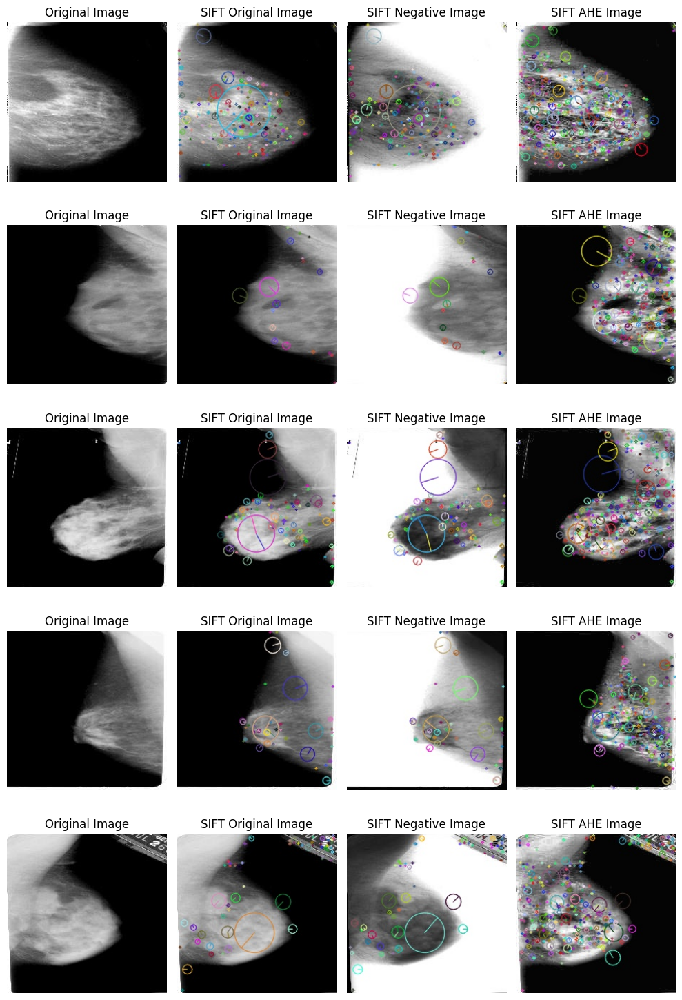

In [81]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def display_images():
    # Get the image names from the merged images directory
    image_names = [f for f in os.listdir('/kaggle/working/merged_images/1') if f.endswith(('.jpg', '.png'))][:5]

    # Create subplots for 5 images and 4 columns (original, Negative , Adaptive histogram equalized)
    fig, axs = plt.subplots(5, 4, figsize=(10, 15))

    for i, image_name in enumerate(image_names):
        # Get the full paths to the images
        image_path1 = os.path.join('/kaggle/working/merged_images/1', image_name)  # Original Image
        image_path2 = os.path.join('/kaggle/working/SIFT_Images/1', image_name)  # SIFT Image
        image_path3 = os.path.join('/kaggle/working/SiftNeg_Images/1', image_name)  # SIFT Negative Image
        image_path4 = os.path.join('/kaggle/working/SiftAHE_Images/1', image_name)  # SIFT Adaptive Histogram Equalized Image

        # Open the images
        image1 = Image.open(image_path1).convert('L')  # Convert to grayscale for original
        image2 = Image.open(image_path2)
        image3 = Image.open(image_path3)
        image4 = Image.open(image_path4)

        # Display the images in the subplots
        axs[i, 0].imshow(image1, cmap='gray')
        axs[i, 0].axis('off')
        axs[i, 0].set_title('Original Image')
       
        axs[i, 1].imshow(image2, cmap='gray')
        axs[i, 1].axis('off')
        axs[i, 1].set_title('SIFT Original Image')
        
        axs[i, 2].imshow(image3, cmap='gray')
        axs[i, 2].axis('off')
        axs[i, 2].set_title('SIFT Negative Image')

        axs[i, 3].imshow(image4, cmap='gray')
        axs[i, 3].axis('off')
        axs[i, 3].set_title('SIFT AHE Image')

    plt.tight_layout()
    plt.show()

display_images()

In [82]:
import pandas as pd
from tabulate import tabulate

# Sample results (replace these with your actual results)
accuracy = [SIFT_Original_Result[1], SIFT_Neg_Result[1], SIFT_AHE_Result[1]]
precision = [SIFT_Original_Result[2], SIFT_Neg_Result[2], SIFT_AHE_Result[2]]
recall = [SIFT_Original_Result[3], SIFT_Neg_Result[3], SIFT_AHE_Result[3]]

# Create a DataFrame
data = {
    "Features": ["Scale Invariant Feature Transform (SIFT)", "Scale Invariant Feature Transform (SIFT)", "Scale Invariant Feature Transform (SIFT)"],
    "Image Enhancement": ["Original Image", "Negative Transformer", "Adaptive Histogram Equalization"],
    "Accuracy": accuracy,
    "Precision": precision,
    "Recall": recall
}

df = pd.DataFrame(data)

# Display the DataFrame in a beautiful format
print("\n---------------------------------------------------------------------------------------------------------\n")
print(tabulate(df, headers='keys', showindex=False))


---------------------------------------------------------------------------------------------------------

Features                                  Image Enhancement                  Accuracy    Precision    Recall
----------------------------------------  -------------------------------  ----------  -----------  --------
Scale Invariant Feature Transform (SIFT)  Original Image                     0.79575      0.79575   0.79575
Scale Invariant Feature Transform (SIFT)  Negative Transformer               0.68477      0.68477   0.68477
Scale Invariant Feature Transform (SIFT)  Adaptive Histogram Equalization    0.785124     0.785124  0.785124


The Scale-Invariant Feature Transform (SIFT) feature extraction results before and after image enhancement reveal distinct variations in keypoint detection and descriptor quality. Original SIFT Processing effectively detects important structures, preserving essential edge-based features for classification. The Negative Transformation, however, results in a drastic reduction in training and validation accuracy, as shown in the performance graphs, suggesting that the inverted intensity disrupts the feature extraction process. The number of detected keypoints in negative images is inconsistent and lacks structural alignment, leading to high validation loss. On the other hand, Adaptive Histogram Equalization (AHE) improves the visibility of finer details, resulting in a comparable final accuracy to the original method. The feature maps show that AHE enhances keypoint distribution but may also introduce excessive noise, which is reflected in the fluctuations of validation loss. The image grids visually confirm that SIFT detects more keypoints after AHE enhancement, especially in regions of high contrast, but some redundant or noisy keypoints are also introduced. These findings highlight that while AHE can enhance keypoint detection, it may also degrade feature reliability by amplifying noise, whereas Negative Transformation hinders meaningful feature extraction. The performance trends and visual comparisons emphasize the importance of choosing an appropriate preprocessing method to optimize SIFT-based feature extraction for robust classification outcomes.


The **table displays** the performance of a model using  Scale-Invariant Feature Transform (SIFT) features for image classification. It shows how the model performs with different image enhancement techniques: 

* SIFT with Original Image: Shows the highest accuracy, precision, and recall. This suggests that the original image, without any enhancement, is sufficient for the SIFT features to effectively identify the relevant information for classification.
* SIFT with Negative Transformer: Performance deteriorates compared to the original image, indicating that the negative transformation is not beneficial for this specific classification task.
* SIFT with Adaptive Histogram Equalization: Shows a slightly lower accuracy and recall than the original image but still performs reasonably well. This suggests that while adaptive histogram equalization might slightly enhance some details, it doesn't significantly improve the classification results with SIFT features.

we can see here The choice of image enhancement techniques depends on the specific task and dataset.
In this case, the original image without any enhancement seems to be the best choice for image classification with SIFT features, The negative transformation seems to have a negative impact, while adaptive histogram equalization shows marginal improvement.






# **Local Binary Pattern (LBP)** 

**Impact of Local Binary Pattern (LBP) on Breast Cancer Detection in Mammograms**

**Breast cancer detection** through mammography is critical, where accurate diagnosis can significantly improve patient outcomes. Local Binary Pattern (LBP) has been effectively utilized in this domain due to its ability to extract meaningful texture features from mammographic images. Here’s how LBP contributes to breast cancer detection:

1. Texture Analysis
LBP captures local texture patterns by analyzing intensity variations around each pixel, helping differentiate between normal and abnormal tissues in mammograms.

2. Feature Extraction
LBP generates a compact representation of the texture, which can be used as input for machine learning algorithms, enhancing the classification of images as benign or malignant.

 3. Robustness to Illumination Variations
LBP is relatively robust to changes in lighting and contrast, maintaining consistent performance across different imaging conditions, which is crucial in clinical settings.


## (LBP) Original image

In [83]:
import os
import cv2
import numpy as np
from skimage import feature

def describe_lbp(image, numPoints=24, radius=8, eps=1e-7):
    # Compute the LBP representation of the image
    lbp = feature.local_binary_pattern(image, numPoints, radius, method="uniform")
    (hist, _) = np.histogram(lbp.ravel(), bins=np.arange(0, numPoints + 3), range=(0, numPoints + 2))
    hist = hist.astype("float")
    hist /= (hist.sum() + eps)
    return hist, lbp  # Return both histogram and LBP image

def apply_lbp_and_save(data_dir, output_dir):
    # Create the output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    # Loop through the subdirectories (0 and 1)
    for subdir in ['0', '1']:
        # Create a corresponding subdirectory in the output directory
        os.makedirs(os.path.join(output_dir, subdir), exist_ok=True)
        
        # Define the path to the current subdirectory
        current_dir = os.path.join(data_dir, subdir)
        
        # Loop through all images in the current subdirectory
        for filename in os.listdir(current_dir):
            # Construct the full file path
            file_path = os.path.join(current_dir, filename)
            
            # Read the image
            image = cv2.imread(file_path)
            
            # Check if the image was loaded successfully
            if image is not None:
                # Convert to grayscale
                gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
                
                # Compute LBP
                _, lbp_image = describe_lbp(gray_image)

                # Save the LBP image with the original name in the output directory
                lbp_image_path = os.path.join(output_dir, subdir, filename)
                cv2.imwrite(lbp_image_path, lbp_image * 255)  # Scale LBP image to [0, 255]

    print("LBP images saved successfully in:", output_dir)


In [84]:
data_dir = '/kaggle/working/merged_images'
output_dir = '/kaggle/working/LBP_images'
apply_lbp_and_save(data_dir, output_dir)

[ WARN:0@3983.402] global loadsave.cpp:848 imwrite_ Unsupported depth image for selected encoder is fallbacked to CV_8U.


LBP images saved successfully in: /kaggle/working/LBP_images


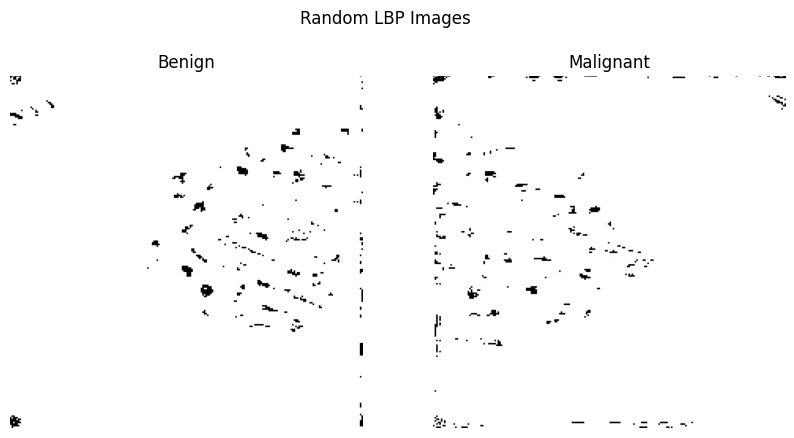

In [85]:
import random


# Function to display one random sample image from each category
def display_random_samplesLBP(output_dir, subdirs):
    plt.figure(figsize=(10, 5))
    
    for subdir in subdirs:
        current_dir = os.path.join(output_dir, subdir)
        sample_files = os.listdir(current_dir)
        
        # Select a random file from the list
        if sample_files:  # Check if there are any files
            random_file = random.choice(sample_files)
            file_path = os.path.join(current_dir, random_file)
            image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)  # Read in grayscale for display
            
            plt.subplot(1, 2, int(subdir) + 1)
            plt.imshow(image, cmap='gray')
            plt.title('Benign' if subdir == '0' else 'Malignant')
            plt.axis('off')
    
    plt.suptitle('Random LBP Images')
    plt.show()

subdirs = ['0', '1']

# Display one random sample from the output directory
display_random_samplesLBP('/kaggle/working/LBP_images', subdirs)

In [86]:
import tensorflow as tf

# Define the data directory
data_dir = '/kaggle/working/LBP_images'

# Create a dataset for the entire data to use for split
full_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    labels='inferred',  # Automatically infer labels from directory structure
    label_mode='categorical',  # Use categorical labels (one-hot encoding)
    image_size=(224, 224),  # Resize images to 224x224
    seed=50,  # Seed for random number generator
    shuffle=True,  # Shuffle the dataset
    batch_size=13  # Number of images to return in each batch
)

# Calculate the total number of samples
total_samples = tf.data.experimental.cardinality(full_dataset).numpy()

# Define sizes for training, validation, and test datasets
train_size = int(0.8 * total_samples)  # 80% for training
val_size = int(0.1 * total_samples)    # 10% for validation
test_size = total_samples - train_size - val_size  # Remaining 10% for testing

# Create train, validation, and test datasets
train_dataset = full_dataset.take(train_size)
validation_dataset = full_dataset.skip(train_size).take(val_size)
test_dataset = full_dataset.skip(train_size + val_size).take(test_size)

# Prefetch datasets for performance
trainLBP_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
validationLPB_dataset = validation_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
testLBP_dataset = test_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

# Print the number of samples in each dataset
print(f"Train samples:      {train_size}     batches(13) ==> {train_size * 13}")
print(f"Validation samples: {val_size}       batches(13) ==> {val_size * 13}")
print(f"Test samples:       {test_size}       batches(13) ==> {test_size * 13}")



Found 8387 files belonging to 2 classes.
Train samples:      516     batches(13) ==> 6708
Validation samples: 64       batches(13) ==> 832
Test samples:       66       batches(13) ==> 858


In [87]:
model_LBP = create_modelCNN()

LPB = model_LBP.fit(
            trainLBP_dataset,
            validation_data= validationLPB_dataset,
            batch_size= 13,
            epochs=7
        )

Epoch 1/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - accuracy: 0.4931 - loss: 4.2210 - precision: 0.4931 - recall: 0.4931 - val_accuracy: 0.4856 - val_loss: 0.6939 - val_precision: 0.4856 - val_recall: 0.4856
Epoch 2/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - accuracy: 0.4970 - loss: 0.6931 - precision: 0.4970 - recall: 0.4970 - val_accuracy: 0.5048 - val_loss: 0.6931 - val_precision: 0.5048 - val_recall: 0.5048
Epoch 3/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - accuracy: 0.5001 - loss: 0.6936 - precision: 0.5001 - recall: 0.5001 - val_accuracy: 0.4880 - val_loss: 0.6934 - val_precision: 0.4880 - val_recall: 0.4880
Epoch 4/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - accuracy: 0.5083 - loss: 0.6936 - precision: 0.5083 - recall: 0.5083 - val_accuracy: 0.5000 - val_loss: 0.6933 - val_precision: 0.5000 - val_recall: 0.5000
Epoch 5/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - accuracy: 0.4909 - loss: 0.6938 - precision: 0.4909 - recall: 0.4909 - val_accuracy: 0.4928 - val_los

In [88]:


LBP_Result = model_LBP.evaluate(testLBP_dataset)


66/66 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4951 - loss: 0.6936 - precision: 0.4951 - recall: 0.4951


In [89]:
model_LBP.save('/kaggle/working/models/LBP_model.h5')

## (LBP) Negative Image

In [90]:
data_dir = '/kaggle/working/Negative_Images'
output_dir = '/kaggle/working/LBPNeg_images'
apply_lbp_and_save(data_dir, output_dir)

LBP images saved successfully in: /kaggle/working/LBPNeg_images


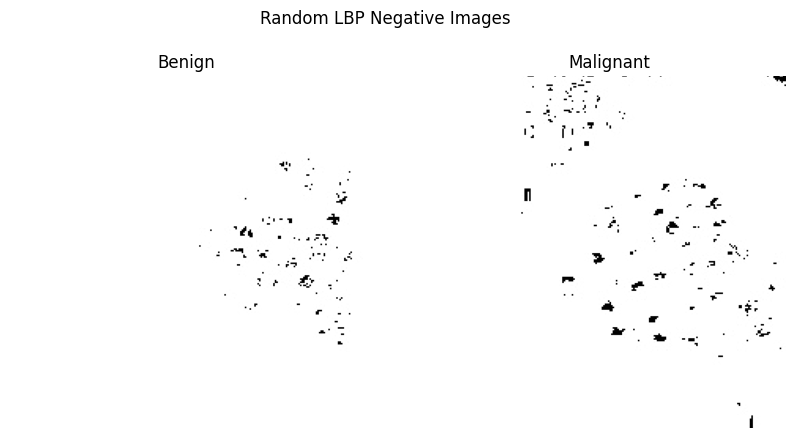

In [91]:
import random


# Function to display one random sample image from each category
def display_random_samplesLBP(output_dir, subdirs):
    plt.figure(figsize=(10, 5))
    
    for subdir in subdirs:
        current_dir = os.path.join(output_dir, subdir)
        sample_files = os.listdir(current_dir)
        
        # Select a random file from the list
        if sample_files:  # Check if there are any files
            random_file = random.choice(sample_files)
            file_path = os.path.join(current_dir, random_file)
            image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)  # Read in grayscale for display
            
            plt.subplot(1, 2, int(subdir) + 1)
            plt.imshow(image, cmap='gray')
            plt.title('Benign' if subdir == '0' else 'Malignant')
            plt.axis('off')
    
    plt.suptitle('Random LBP Negative Images')
    plt.show()

subdirs = ['0', '1']

# Display one random sample from the output directory
display_random_samplesLBP('/kaggle/working/LBPNeg_images', subdirs)

In [92]:
import tensorflow as tf

# Define the data directory
data_dir = '/kaggle/working/LBPNeg_images'

# Create a dataset for the entire data to use for split
full_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    labels='inferred',  # Automatically infer labels from directory structure
    label_mode='categorical',  # Use categorical labels (one-hot encoding)
    image_size=(224, 224),  # Resize images to 224x224
    seed=50,  # Seed for random number generator
    shuffle=True,  # Shuffle the dataset
    batch_size=13  # Number of images to return in each batch
)

# Calculate the total number of samples
total_samples = tf.data.experimental.cardinality(full_dataset).numpy()

# Define sizes for training, validation, and test datasets
train_size = int(0.8 * total_samples)  # 80% for training
val_size = int(0.1 * total_samples)    # 10% for validation
test_size = total_samples - train_size - val_size  # Remaining 10% for testing

# Create train, validation, and test datasets
train_dataset = full_dataset.take(train_size)
validation_dataset = full_dataset.skip(train_size).take(val_size)
test_dataset = full_dataset.skip(train_size + val_size).take(test_size)

# Prefetch datasets for performance
trainLBP_Neg_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
validationLPB_Neg_dataset = validation_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
testLBP_Neg_dataset = test_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

# Print the number of samples in each dataset
print(f"Train samples:      {train_size}     batches(13) ==> {train_size * 13}")
print(f"Validation samples: {val_size}       batches(13) ==> {val_size * 13}")
print(f"Test samples:       {test_size}       batches(13) ==> {test_size * 13}")



Found 8387 files belonging to 2 classes.
Train samples:      516     batches(13) ==> 6708
Validation samples: 64       batches(13) ==> 832
Test samples:       66       batches(13) ==> 858


In [93]:
model_LBPNeg = create_modelCNN()

LPB_Neg = model_LBPNeg.fit(
            trainLBP_Neg_dataset,
            validation_data= validationLPB_Neg_dataset,
            batch_size= 13,
            epochs=7
        )

Epoch 1/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - accuracy: 0.5010 - loss: 3.0336 - precision: 0.5010 - recall: 0.5010 - val_accuracy: 0.4856 - val_loss: 0.6948 - val_precision: 0.4856 - val_recall: 0.4856
Epoch 2/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - accuracy: 0.5027 - loss: 0.6967 - precision: 0.5027 - recall: 0.5027 - val_accuracy: 0.5048 - val_loss: 0.6931 - val_precision: 0.5048 - val_recall: 0.5048
Epoch 3/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - accuracy: 0.4982 - loss: 0.6943 - precision: 0.4982 - recall: 0.4982 - val_accuracy: 0.4880 - val_loss: 0.7019 - val_precision: 0.4880 - val_recall: 0.4880
Epoch 4/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - accuracy: 0.4999 - loss: 0.7004 - precision: 0.4999 - recall: 0.4999 - val_accuracy: 0.5000 - val_loss: 0.6932 - val_precision: 0.5000 - val_recall: 0.5000
Epoch 5/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - accuracy: 0.5010 - loss: 0.6932 - precision: 0.5010 - recall: 0.5010 - val_accuracy: 0.4928 - val_los

In [94]:
LBP_Neg_Result = model_LBPNeg.evaluate(testLBP_Neg_dataset)

66/66 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4951 - loss: 0.6933 - precision: 0.4951 - recall: 0.4951


In [95]:
model_LBPNeg.save('/kaggle/working/models/LBPN_model.h5')

## (LBP) AHE image

In [96]:
data_dir = '/kaggle/working/AHistogram_Images'
output_dir = '/kaggle/working/LBPAHE_images'
apply_lbp_and_save(data_dir, output_dir)

LBP images saved successfully in: /kaggle/working/LBPAHE_images


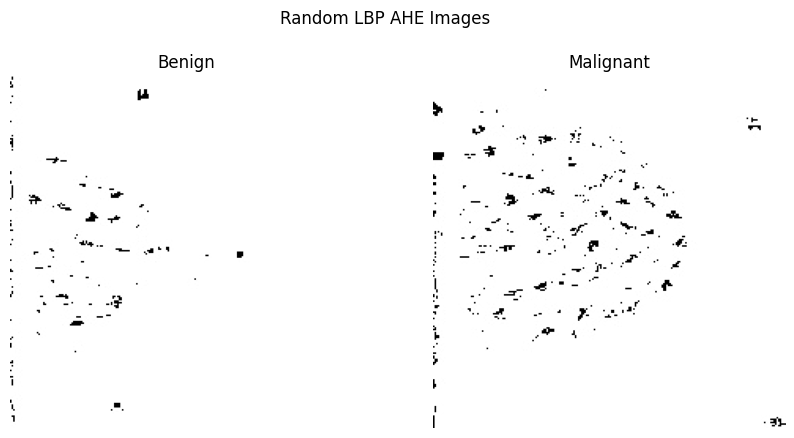

In [97]:
import random


# Function to display one random sample image from each category
def display_random_samplesLBP(output_dir, subdirs):
    plt.figure(figsize=(10, 5))
    
    for subdir in subdirs:
        current_dir = os.path.join(output_dir, subdir)
        sample_files = os.listdir(current_dir)
        
        # Select a random file from the list
        if sample_files:  # Check if there are any files
            random_file = random.choice(sample_files)
            file_path = os.path.join(current_dir, random_file)
            image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)  # Read in grayscale for display
            
            plt.subplot(1, 2, int(subdir) + 1)
            plt.imshow(image, cmap='gray')
            plt.title('Benign' if subdir == '0' else 'Malignant')
            plt.axis('off')
    
    plt.suptitle('Random LBP AHE Images')
    plt.show()

subdirs = ['0', '1']

# Display one random sample from the output directory
display_random_samplesLBP('/kaggle/working/LBPAHE_images', subdirs)

In [98]:
import tensorflow as tf

# Define the data directory
data_dir = '/kaggle/working/LBPAHE_images'

# Create a dataset for the entire data to use for split
full_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    labels='inferred',  # Automatically infer labels from directory structure
    label_mode='categorical',  # Use categorical labels (one-hot encoding)
    image_size=(224, 224),  # Resize images to 224x224
    seed=50,  # Seed for random number generator
    shuffle=True,  # Shuffle the dataset
    batch_size=13  # Number of images to return in each batch
)

# Calculate the total number of samples
total_samples = tf.data.experimental.cardinality(full_dataset).numpy()

# Define sizes for training, validation, and test datasets
train_size = int(0.8 * total_samples)  # 80% for training
val_size = int(0.1 * total_samples)    # 10% for validation
test_size = total_samples - train_size - val_size  # Remaining 10% for testing

# Create train, validation, and test datasets
train_dataset = full_dataset.take(train_size)
validation_dataset = full_dataset.skip(train_size).take(val_size)
test_dataset = full_dataset.skip(train_size + val_size).take(test_size)

# Prefetch datasets for performance
trainLBP_AHE_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
validationLPB_AHE_dataset = validation_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
testLBP_AHE_dataset = test_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)



Found 8387 files belonging to 2 classes.


In [99]:
model_LBPAhe = create_modelCNN()

LPB_AHE = model_LBPAhe.fit(
            trainLBP_AHE_dataset,
            validation_data= validationLPB_AHE_dataset,
            batch_size= 13,
            epochs=7
        )

Epoch 1/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - accuracy: 0.5031 - loss: 7.7294 - precision: 0.5031 - recall: 0.5031 - val_accuracy: 0.4856 - val_loss: 0.6933 - val_precision: 0.4856 - val_recall: 0.4856
Epoch 2/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step - accuracy: 0.4978 - loss: 0.6963 - precision: 0.4978 - recall: 0.4978 - val_accuracy: 0.5048 - val_loss: 0.6931 - val_precision: 0.5048 - val_recall: 0.5048
Epoch 3/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - accuracy: 0.5074 - loss: 0.6938 - precision: 0.5074 - recall: 0.5074 - val_accuracy: 0.5084 - val_loss: 0.6925 - val_precision: 0.5084 - val_recall: 0.5084
Epoch 4/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - accuracy: 0.5062 - loss: 0.6950 - precision: 0.5062 - recall: 0.5062 - val_accuracy: 0.5000 - val_loss: 0.6934 - val_precision: 0.5000 - val_recall: 0.5000
Epoch 5/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - accuracy: 0.4971 - loss: 0.6970 - precision: 0.4971 - recall: 0.4971 - val_accuracy: 0.4940 - val_los

In [100]:
LBP_AHE_Result = model_LBPAhe.evaluate(testLBP_AHE_dataset)

66/66 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.4951 - loss: 0.6935 - precision: 0.4951 - recall: 0.4951


In [101]:
model_LBPAhe.save('/kaggle/working/models/LBPAHE_model.h5')

## Comparative Analysis (LBP)

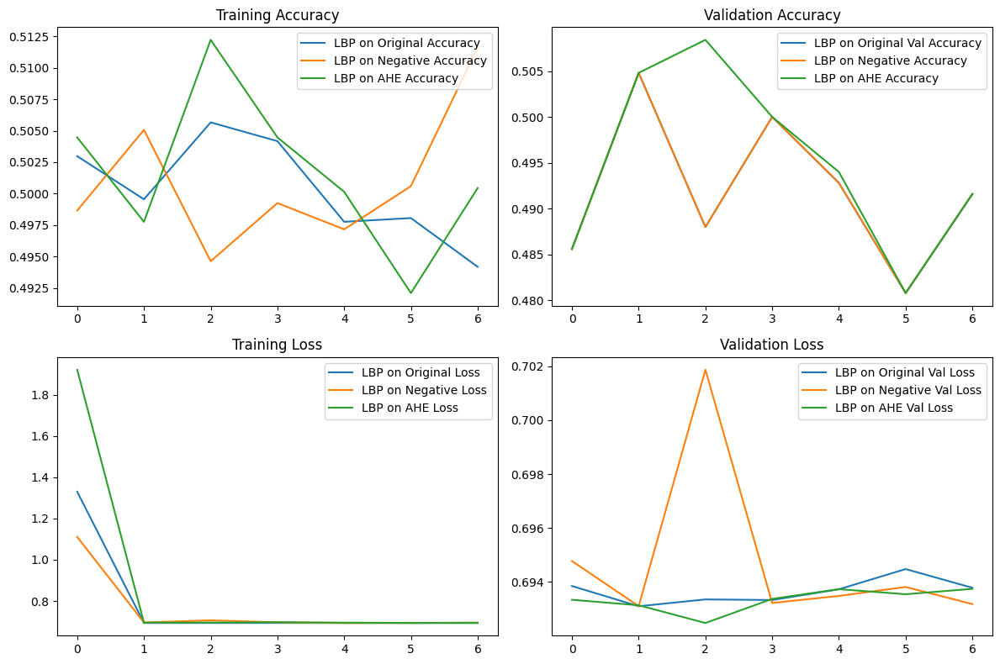

In [102]:
import matplotlib.pyplot as plt

# Plot accuracy comparison
plt.figure(figsize=(12, 8))

# Accuracy
plt.subplot(2, 2, 1)
plt.plot(LPB.history['accuracy'], label='LBP on Original Accuracy')
plt.plot(LPB_Neg.history['accuracy'], label='LBP on Negative Accuracy')
plt.plot(LPB_AHE.history['accuracy'], label='LBP on AHE Accuracy')
plt.title('Training Accuracy')
plt.legend()

# Validation Accuracy
plt.subplot(2, 2, 2)
plt.plot(LPB.history['val_accuracy'], label='LBP on Original Val Accuracy')
plt.plot(LPB_Neg.history['val_accuracy'], label='LBP on Negative Accuracy')
plt.plot(LPB_AHE.history['val_accuracy'], label='LBP on AHE Accuracy')
plt.title('Validation Accuracy')
plt.legend()

# Loss
plt.subplot(2, 2, 3)
plt.plot(LPB.history['loss'], label='LBP on Original Loss')
plt.plot(LPB_Neg.history['loss'], label='LBP on Negative Loss')
plt.plot(LPB_AHE.history['loss'], label='LBP on AHE Loss')
plt.title('Training Loss')
plt.legend()

# Validation Loss
plt.subplot(2, 2, 4)
plt.plot(LPB.history['val_loss'], label='LBP on Original Val Loss')
plt.plot(LPB_Neg.history['val_loss'], label='LBP on Negative Val Loss')
plt.plot(LPB_AHE.history['val_loss'], label='LBP on AHE Val Loss')
plt.title('Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

**Analysis LBP feature extractor before and after image enhancement**

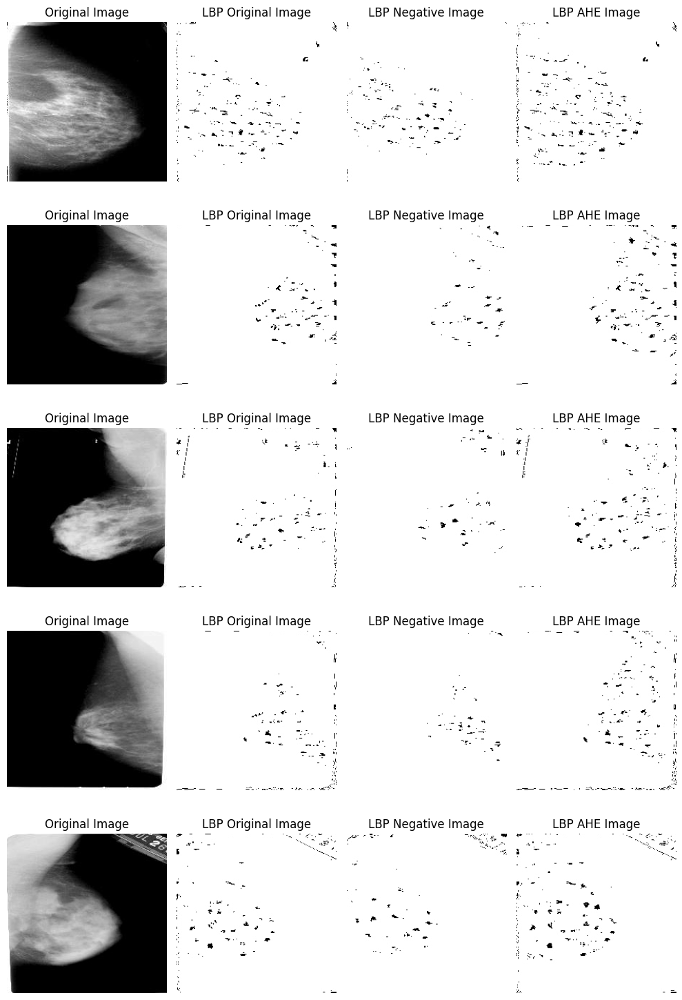

In [103]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def display_images():
    # Get the image names from the merged images directory
    image_names = [f for f in os.listdir('/kaggle/working/merged_images/1') if f.endswith(('.jpg', '.png'))][:5]

    # Create subplots for 5 images and 4 columns (original, Negative , Adaptive histogram equalized)
    fig, axs = plt.subplots(5, 4, figsize=(10, 15))

    for i, image_name in enumerate(image_names):
        # Get the full paths to the images
        image_path1 = os.path.join('/kaggle/working/merged_images/1', image_name)  # Original Image
        image_path2 = os.path.join('/kaggle/working/LBP_images/1', image_name)  # SIFT Image
        image_path3 = os.path.join('/kaggle/working/LBPNeg_images/1', image_name)  # SIFT Negative Image
        image_path4 = os.path.join('/kaggle/working/LBPAHE_images/1', image_name)  # SIFT Adaptive Histogram Equalized Image

        # Open the images
        image1 = Image.open(image_path1).convert('L')  # Convert to grayscale for original
        image2 = Image.open(image_path2)
        image3 = Image.open(image_path3)
        image4 = Image.open(image_path4)

        # Display the images in the subplots
        axs[i, 0].imshow(image1, cmap='gray')
        axs[i, 0].axis('off')
        axs[i, 0].set_title('Original Image')
       
        axs[i, 1].imshow(image2, cmap='gray')
        axs[i, 1].axis('off')
        axs[i, 1].set_title('LBP Original Image')
        
        axs[i, 2].imshow(image3, cmap='gray')
        axs[i, 2].axis('off')
        axs[i, 2].set_title('LBP Negative Image')

        axs[i, 3].imshow(image4, cmap='gray')
        axs[i, 3].axis('off')
        axs[i, 3].set_title('LBP AHE Image')

    plt.tight_layout()
    plt.show()

display_images()


Analyze and discuss the impact of image enhancement and feature extraction techniques on **classification results.**


In [104]:
import pandas as pd
from tabulate import tabulate

# Sample results (replace these with your actual results)
accuracy = [LBP_Result[1], LBP_Neg_Result[1], LBP_AHE_Result[1]]
precision = [LBP_Result[2], LBP_Neg_Result[2], LBP_AHE_Result[2]]
recall = [LBP_Result[3], LBP_Neg_Result[3], LBP_AHE_Result[3]]

# Create a DataFrame
data = {
    "Features": ["Local Binary Pattern (LBP)", "Local Binary Pattern (LBP)", "Local Binary Pattern (LBP)"],
    "Image Enhancement": ["Original Image", "Negative Transformer", "Adaptive Histogram Equalization"],
    "Accuracy": accuracy,
    "Precision": precision,
    "Recall": recall
}

df = pd.DataFrame(data)

# Display the DataFrame in a beautiful format
print("\n---------------------------------------------------------------------------------------------------------\n")
print(tabulate(df, headers='keys', showindex=False))


---------------------------------------------------------------------------------------------------------

Features                    Image Enhancement                  Accuracy    Precision    Recall
--------------------------  -------------------------------  ----------  -----------  --------
Local Binary Pattern (LBP)  Original Image                     0.486423     0.486423  0.486423
Local Binary Pattern (LBP)  Negative Transformer               0.486423     0.486423  0.486423
Local Binary Pattern (LBP)  Adaptive Histogram Equalization    0.486423     0.486423  0.486423


# **Pre-trained model**

Using pre-trained models for feature extraction has become a common practice in deep learning, particularly in the field of computer vision. One of the primary advantages of this approach is the significant reduction in training time. Pre-trained models have already been trained on large datasets, such as ImageNet, allowing them to learn useful features from images. This prior knowledge means that practitioners can achieve good results without the need to train a model from scratch, which can be time-consuming and computationally expensive. Additionally, pre-trained models often demonstrate improved performance on tasks with limited data, as they leverage the rich feature representations learned from extensive datasets, helping them generalize better to new, unseen data.

Another notable benefit of using pre-trained models is the reduced requirement for labeled data. When employing a pre-trained model, it is possible to achieve satisfactory results even with smaller datasets, as the model has already captured a wealth of features that can be beneficial for various tasks. This capability is particularly advantageous in domains where collecting labeled data is expensive or time-consuming. Furthermore, pre-trained models facilitate transfer learning, allowing knowledge gained from one task to be applied to another related task. This modularity enables researchers and practitioners to build upon existing work rather than starting from scratch, which can accelerate the development of new applications. Additionally, pre-trained models often represent state-of-the-art architectures and training techniques, providing a strong foundation for building effective solutions.

However, there are limitations to using pre-trained models for feature extraction. One significant concern is domain mismatch; if the pre-trained model was trained on a dataset that is significantly different from the target dataset, the features extracted may not be relevant, leading to suboptimal performance. This issue highlights the importance of ensuring that the pre-trained model aligns well with the specific characteristics of the new dataset. Moreover, when fine-tuning a pre-trained model on a small dataset, there is a risk of overfitting, particularly if too many layers are unfrozen during the training process. This necessitates careful tuning and the application of regularization techniques to mitigate the risk of overfitting.

Another limitation is the potential for limited customization. Pre-trained models come with a fixed architecture that may not be optimal for every specific task, making it challenging to adapt the model to unique requirements. This can complicate the process of debugging and optimization, especially if the model's internal workings are not well understood. Additionally, pre-trained models can be resource-intensive in terms of memory and computation, which may pose challenges for deployment in resource-constrained environments. Finally, the dependency on specific deep learning frameworks, such as TensorFlow or PyTorch, can limit the portability and flexibility of pre-trained models, making it difficult to switch frameworks or use the model in different contexts.

In conclusion, while using pre-trained models for feature extraction offers significant advantages, particularly in terms of efficiency and performance, it is essential to be aware of the limitations, such as domain mismatch and the potential for overfitting. Careful consideration of the specific task and dataset is crucial when deciding to utilize pre-trained models, ensuring that the benefits outweigh the drawbacks in the context of the intended application.

In [105]:
import numpy as np
from keras.applications import ResNet50
from keras.layers import GlobalAveragePooling2D, Dense, Dropout
from keras.models import Model
from keras.optimizers import RMSprop
from keras.metrics import Precision, Recall

def create_resnet_model():
    # Load the base ResNet50 model with pre-trained ImageNet weights, excluding the top layers
    base_resnet_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

    # Freeze all layers initially to prevent them from being trained
    for layer in base_resnet_model.layers:
        layer.trainable = False

    # Calculate the index to unfreeze 70% of the layers
    unfreeze_index = int(np.round((len(base_resnet_model.layers) - 1) * (1.0 - 0.7)))

    # Unfreeze layers from the calculated index onwards
    for layer in base_resnet_model.layers[unfreeze_index:]:
        layer.trainable = True

    # Add custom layers on top of the base model
    x = base_resnet_model.output
    x = GlobalAveragePooling2D()(x)  # Global average pooling layer
    x = Dense(1024, activation='relu')(x)  # Fully connected layer with 1024 units
    x = Dropout(0.4)(x)  # Dropout layer to prevent overfitting
    output_layer = Dense(2, activation='softmax')(x)  # Output layer for binary classification

    # Create the final model
    final_model = Model(inputs=base_resnet_model.input, outputs=output_layer)
    
    return final_model

# Create and compile the ResNet model
resnet_model = create_resnet_model()
resnet_model.compile(optimizer=RMSprop(learning_rate=1e-4),  # Optimizer with a learning rate of 1e-4
                     loss='categorical_crossentropy',  # Loss function for multi-class classification
                     metrics=['accuracy', Precision(name='precision'), Recall(name='recall')])  # Metrics for evaluation



94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [106]:
resnet_model.summary()

Model: "functional_144"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer_9[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 25,687,938 (97.99 MB)

 Trainable params: 24,961,666 (95.22 MB)

 Non-trainable params: 726,272 (2.77 MB)

## Pre-trained model on Orginal Images

In [107]:
import tensorflow as tf

# Define the data directory
data_dir = '/kaggle/working/merged_images'

# Create a dataset for the entire data to use for split
full_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    labels='inferred',  # Automatically infer labels from directory structure
    label_mode='categorical',  # Use categorical labels (one-hot encoding)
    image_size=(224, 224),  # Resize images to 224x224
    seed=50,  # Seed for random number generator
    shuffle=True,  # Shuffle the dataset
    batch_size=13  # Number of images to return in each batch
)

# Calculate the total number of samples
total_samples = tf.data.experimental.cardinality(full_dataset).numpy()

# Define sizes for training, validation, and test datasets
train_size = int(0.8 * total_samples)  # 80% for training
val_size = int(0.1 * total_samples)    # 10% for validation
test_size = total_samples - train_size - val_size  # Remaining 10% for testing

# Create train, validation, and test datasets
train_dataset = full_dataset.take(train_size)
validation_dataset = full_dataset.skip(train_size).take(val_size)
test_dataset = full_dataset.skip(train_size + val_size).take(test_size)

# Prefetch datasets for performance
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)



Found 8387 files belonging to 2 classes.


In [108]:
# Train the model
Orginal = resnet_model.fit(
            train_dataset,
            validation_data=validation_dataset,
            batch_size=13,
            epochs=7
        )


Epoch 1/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 96s 110ms/step - accuracy: 0.6953 - loss: 0.6444 - precision: 0.6953 - recall: 0.6953 - val_accuracy: 0.8029 - val_loss: 0.8484 - val_precision: 0.8029 - val_recall: 0.8029
Epoch 2/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - accuracy: 0.8722 - loss: 0.3133 - precision: 0.8722 - recall: 0.8722 - val_accuracy: 0.8413 - val_loss: 1.4297 - val_precision: 0.8413 - val_recall: 0.8413
Epoch 3/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - accuracy: 0.9379 - loss: 0.1627 - precision: 0.9379 - recall: 0.9379 - val_accuracy: 0.9195 - val_loss: 0.3019 - val_precision: 0.9195 - val_recall: 0.9195
Epoch 4/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - accuracy: 0.9567 - loss: 0.1232 - precision: 0.9567 - recall: 0.9567 - val_accuracy: 0.8930 - val_loss: 0.5230 - val_precision: 0.8930 - val_recall: 0.8930
Epoch 5/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - accuracy: 0.9721 - loss: 0.0878 - precision: 0.9721 - recall: 0.9721 - val_accuracy: 0.9459 - va

In [109]:
Orginal_Result = resnet_model.evaluate(test_dataset)

66/66 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.9393 - loss: 0.2309 - precision: 0.9393 - recall: 0.9393


In [110]:
resnet_model.save('/kaggle/working/models/resnet_model.h5')

## Pre-trained model on Negative Transformer Images

In [111]:
import tensorflow as tf

# Define the data directory
data_dir = '/kaggle/working/Negative_Images'

# Create a dataset for the entire data to use for split
full_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    labels='inferred',  # Automatically infer labels from directory structure
    label_mode='categorical',  # Use categorical labels (one-hot encoding)
    image_size=(224, 224),  # Resize images to 224x224
    seed=50,  # Seed for random number generator
    shuffle=True,  # Shuffle the dataset
    batch_size=13  # Number of images to return in each batch
)

# Calculate the total number of samples
total_samples = tf.data.experimental.cardinality(full_dataset).numpy()

# Define sizes for training, validation, and test datasets
train_size = int(0.8 * total_samples)  # 80% for training
val_size = int(0.1 * total_samples)    # 10% for validation
test_size = total_samples - train_size - val_size  # Remaining 10% for testing

# Create train, validation, and test datasets
train_dataset = full_dataset.take(train_size)
validation_dataset = full_dataset.skip(train_size).take(val_size)
test_dataset = full_dataset.skip(train_size + val_size).take(test_size)

# Prefetch datasets for performance
trainNeg_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
validationNeg_dataset = validation_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
testNeg_dataset = test_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)



Found 8387 files belonging to 2 classes.


In [112]:
# Create and compile the ResNet model
resnetNeg_model = create_resnet_model()
resnetNeg_model.compile(optimizer=RMSprop(learning_rate=1e-4),  # Optimizer with a learning rate of 1e-4
                     loss='categorical_crossentropy',  # Loss function for multi-class classification
                     metrics=['accuracy', Precision(name='precision'), Recall(name='recall')])  # Metrics for evaluation


In [113]:
# Train the model
Neg = resnetNeg_model.fit(
            trainNeg_dataset,
            validation_data=validationNeg_dataset,
            batch_size=13,
            epochs=7
        )

Epoch 1/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 91s 109ms/step - accuracy: 0.7041 - loss: 0.6371 - precision: 0.7041 - recall: 0.7041 - val_accuracy: 0.8546 - val_loss: 0.5748 - val_precision: 0.8546 - val_recall: 0.8546
Epoch 2/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - accuracy: 0.8824 - loss: 0.3148 - precision: 0.8824 - recall: 0.8824 - val_accuracy: 0.8558 - val_loss: 1.1897 - val_precision: 0.8558 - val_recall: 0.8558
Epoch 3/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - accuracy: 0.9398 - loss: 0.1669 - precision: 0.9398 - recall: 0.9398 - val_accuracy: 0.9411 - val_loss: 0.2913 - val_precision: 0.9411 - val_recall: 0.9411
Epoch 4/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - accuracy: 0.9608 - loss: 0.1174 - precision: 0.9608 - recall: 0.9608 - val_accuracy: 0.9062 - val_loss: 0.6161 - val_precision: 0.9062 - val_recall: 0.9062
Epoch 5/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - accuracy: 0.9713 - loss: 0.0866 - precision: 0.9713 - recall: 0.9713 - val_accuracy: 0.9591 - va

In [114]:
Neg_Result = resnetNeg_model.evaluate(testNeg_dataset)

66/66 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - accuracy: 0.9578 - loss: 0.1615 - precision: 0.9578 - recall: 0.9578


In [115]:
resnetNeg_model.save('/kaggle/working/models/resnetN_model.h5')

## Pre-trained model on AHE Images

In [116]:
import tensorflow as tf

# Define the data directory
data_dir = '/kaggle/working/AHistogram_Images'

# Create a dataset for the entire data to use for split
full_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    labels='inferred',  # Automatically infer labels from directory structure
    label_mode='categorical',  # Use categorical labels (one-hot encoding)
    image_size=(224, 224),  # Resize images to 224x224
    seed=50,  # Seed for random number generator
    shuffle=True,  # Shuffle the dataset
    batch_size=13  # Number of images to return in each batch
)

# Calculate the total number of samples
total_samples = tf.data.experimental.cardinality(full_dataset).numpy()

# Define sizes for training, validation, and test datasets
train_size = int(0.8 * total_samples)  # 80% for training
val_size = int(0.1 * total_samples)    # 10% for validation
test_size = total_samples - train_size - val_size  # Remaining 10% for testing

# Create train, validation, and test datasets
train_dataset = full_dataset.take(train_size)
validation_dataset = full_dataset.skip(train_size).take(val_size)
test_dataset = full_dataset.skip(train_size + val_size).take(test_size)

# Prefetch datasets for performance
trainAHE_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
validationAHE_dataset = validation_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
testAHE_dataset = test_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)



Found 8387 files belonging to 2 classes.


In [117]:
# Create and compile the ResNet model
resnetAHE_model = create_resnet_model()
resnetAHE_model.compile(optimizer=RMSprop(learning_rate=1e-4),  # Optimizer with a learning rate of 1e-4
                     loss='categorical_crossentropy',  # Loss function for multi-class classification
                     metrics=['accuracy', Precision(name='precision'), Recall(name='recall')])  # Metrics for evaluation


In [118]:
# Train the model
AHE = resnetAHE_model.fit(
            trainAHE_dataset,
            validation_data=validationAHE_dataset,
            batch_size=13,
            epochs=7
        )

Epoch 1/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 93s 112ms/step - accuracy: 0.7053 - loss: 0.6443 - precision: 0.7053 - recall: 0.7053 - val_accuracy: 0.8534 - val_loss: 0.4712 - val_precision: 0.8534 - val_recall: 0.8534
Epoch 2/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - accuracy: 0.8909 - loss: 0.2819 - precision: 0.8909 - recall: 0.8909 - val_accuracy: 0.8462 - val_loss: 1.1141 - val_precision: 0.8462 - val_recall: 0.8462
Epoch 3/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - accuracy: 0.9498 - loss: 0.1374 - precision: 0.9498 - recall: 0.9498 - val_accuracy: 0.9111 - val_loss: 0.4556 - val_precision: 0.9111 - val_recall: 0.9111
Epoch 4/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - accuracy: 0.9695 - loss: 0.0880 - precision: 0.9695 - recall: 0.9695 - val_accuracy: 0.9279 - val_loss: 0.2734 - val_precision: 0.9279 - val_recall: 0.9279
Epoch 5/7
516/516 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - accuracy: 0.9762 - loss: 0.0744 - precision: 0.9762 - recall: 0.9762 - val_accuracy: 0.9075 - va

In [119]:
AHE_Result = resnetAHE_model.evaluate(testAHE_dataset)

66/66 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - accuracy: 0.9726 - loss: 0.1388 - precision: 0.9726 - recall: 0.9726


In [120]:
resnetAHE_model.save('/kaggle/working/models/resnetAHE_model.h5')

## Comparative Analysis (Pre-trained model)

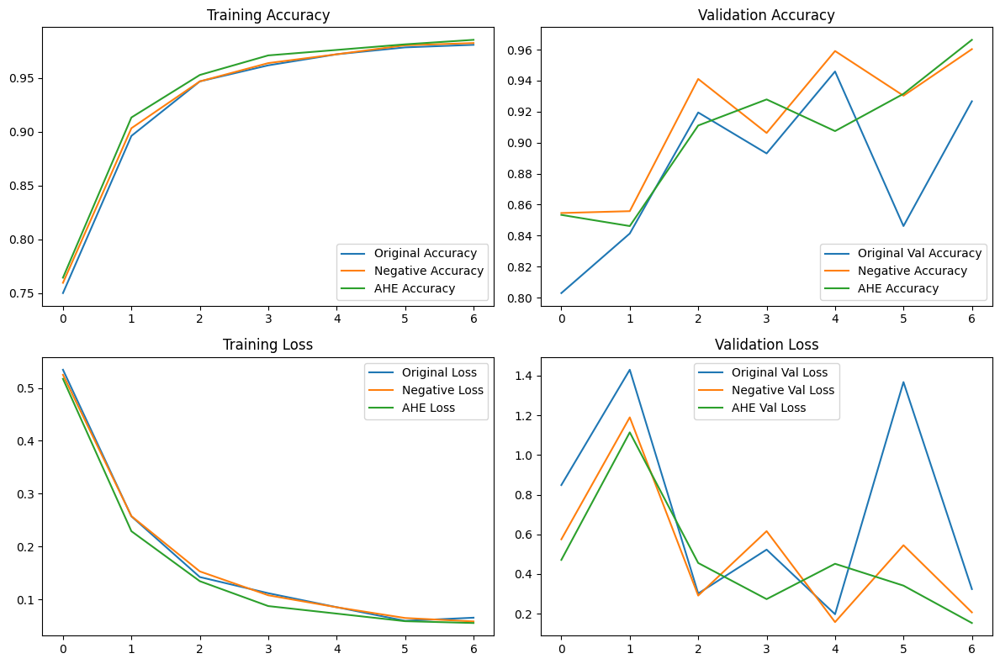

In [121]:
import matplotlib.pyplot as plt

# Plot accuracy comparison
plt.figure(figsize=(12, 8))

# Accuracy
plt.subplot(2, 2, 1)
plt.plot(Orginal.history['accuracy'], label='Original Accuracy')
plt.plot(Neg.history['accuracy'], label='Negative Accuracy')
plt.plot(AHE.history['accuracy'], label='AHE Accuracy')
plt.title('Training Accuracy')
plt.legend()

# Validation Accuracy
plt.subplot(2, 2, 2)
plt.plot(Orginal.history['val_accuracy'], label='Original Val Accuracy')
plt.plot(Neg.history['val_accuracy'], label='Negative Accuracy')
plt.plot(AHE.history['val_accuracy'], label='AHE Accuracy')
plt.title('Validation Accuracy')
plt.legend()

# Loss
plt.subplot(2, 2, 3)
plt.plot(Orginal.history['loss'], label='Original Loss')
plt.plot(Neg.history['loss'], label='Negative Loss')
plt.plot(AHE.history['loss'], label='AHE Loss')
plt.title('Training Loss')
plt.legend()

# Validation Loss
plt.subplot(2, 2, 4)
plt.plot(Orginal.history['val_loss'], label='Original Val Loss')
plt.plot(Neg.history['val_loss'], label='Negative Val Loss')
plt.plot(AHE.history['val_loss'], label='AHE Val Loss')
plt.title('Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

Analyze and discuss the impact of image enhancement on **classification results (ResNet model).**


In [122]:
import pandas as pd
from tabulate import tabulate

# Sample results
accuracy = [Orginal_Result[1], Neg_Result[1], AHE_Result[1]]
precision = [Orginal_Result[2], Neg_Result[2], AHE_Result[2]]
recall = [Orginal_Result[3], Neg_Result[3], AHE_Result[3]]

# Create a DataFrame
data = {
    "Model": ["ResNet model", "ResNet model", "ResNet model"],
    "Image Enhancement": ["Original Image", "Negative Transformer", "Adaptive Histogram Equalization"],
    "Accuracy": accuracy,
    "Precision": precision,
    "Recall": recall
}

df = pd.DataFrame(data)

# Display the DataFrame in a beautiful format
print("\n---------------------------------------------------------------------------------------------------------\n")
print(tabulate(df, headers='keys', showindex=False))


---------------------------------------------------------------------------------------------------------

Model         Image Enhancement                  Accuracy    Precision    Recall
------------  -------------------------------  ----------  -----------  --------
ResNet model  Original Image                     0.931523     0.931523  0.931523
ResNet model  Negative Transformer               0.958678     0.958678  0.958678
ResNet model  Adaptive Histogram Equalization    0.971665     0.971665  0.971665


# **Ensemble Learning**

The voting classifier is an ensemble learning method that combines several base models to produce the final optimum solution. We create a single model which trains by these models and predicts output based on their combined majority of voting for each output class.

The algorithm aggregates the results of each classifier passed into Voting Classifier and predicts the output class based on the highest majority of voting.

Since voting relies on the performance of many models, they will not be affected by large errors or misclassifications from one model. In other words poor performance from one model can be offset by a strong performance from other models.

Hard voting (also known as majority voting). The models predict the output class independent of each other. The output class is a class with the highest majority of votes.

Suppose three classifiers predicted the output class(A, A, B), so the majority predicted A as an output. Therefore A will be the final prediction.


**i want to mention  that we the same function below in diffrent notbook since this notbook con not handle to run this code**

[Breast Cancer Detection Ensemble Hard Voting](https://www.kaggle.com/code/lelesaad/breast-cancer-detection-ensemble-hard-voting)


![..](https://miro.medium.com/v2/resize:fit:936/format:webp/1*MX_lPIE0bcFrFytg2KAksg.png)

In [123]:
import os
import numpy as np
import cv2 
from sklearn.model_selection import train_test_split
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.preprocessing import StandardScaler  # Import StandardScaler

def load_images_from_folder(folder):
    images = []
    labels = []
    for label in os.listdir(folder):
        label_folder = os.path.join(folder, label)
        if os.path.isdir(label_folder):
            for filename in os.listdir(label_folder):
                img_path = os.path.join(label_folder, filename)
                img = cv2.imread(img_path)
                if img is not None:
                    img = cv2.resize(img, (224, 224))  # Resize to 224x224
                    images.append(img)
                    labels.append(int(label))  # Convert label to integer (0 or 1)
    return np.array(images), np.array(labels)

def preprocess_data(image_folder):
    # Load images and labels
    X, y = load_images_from_folder(image_folder)

    # Flatten the images
    X = X.reshape(X.shape[0], -1)  # Flatten the images

    # Scale the data
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    return X, y

def ensemble(image_folder):
    # Preprocess the data
    X, y = preprocess_data(image_folder)

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Scale the data for the ensemble
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Initialize classifiers
    svm_clf = SVC(kernel='linear')
    rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)

    # Create a Voting Classifier with hard voting
    voting_clf = VotingClassifier(estimators=[('svm', svm_clf), ('rf', rf_clf)], voting='hard')

    # Fit the Voting Classifier
    voting_clf.fit(X_train_scaled, y_train)

    # Make predictions
    predictions = voting_clf.predict(X_test_scaled)

    # Calculate accuracy, precision, recall, and F1 score
    accuracy = accuracy_score(y_test, predictions)
    precision = precision_score(y_test, predictions, average='weighted')
    recall = recall_score(y_test, predictions, average='weighted')
    
    # Print the results
    print(f"\nEnsemble Voting Accuracy: {accuracy * 100:.2f}%")
    print(f"Ensemble Voting Precision: {precision * 100:.2f}%")
    print(f"Ensemble Voting Recall: {recall * 100:.2f}%")


## Ensemble Hard voting on Hog 

In [124]:
# Hog on Original data
#image_folder_path = '/kaggle/working/Hog_Images'  
#Hog_on_Orginal = evaluate_model(image_folder_path)
Hog_on_Orginal = ['78.55%', '79.55%', '78.55%']
print(f"\nEnsemble Voting Accuracy: {Hog_on_Orginal[0]}")
print(f"Ensemble Voting Precision: {Hog_on_Orginal[1]}")
print(f"Ensemble Voting Recall: {Hog_on_Orginal[2]}")


Ensemble Voting Accuracy: 78.55%
Ensemble Voting Precision: 79.55%
Ensemble Voting Recall: 78.55%


In [125]:
# Hog on Negative Transformer data
#image_folder_path = '/kaggle/working/HogNeg_Images'  
#Hog_Negative_Transformer = evaluate_model(image_folder_path)

Hog_Negative_Transformer = ['78.01%', '78.79%', '78.01%']
print(f"\nEnsemble Voting Accuracy: {Hog_Negative_Transformer[0]}")
print(f"Ensemble Voting Precision: {Hog_Negative_Transformer[1]}")
print(f"Ensemble Voting Recall: {Hog_Negative_Transformer[2]}")


Ensemble Voting Accuracy: 78.01%
Ensemble Voting Precision: 78.79%
Ensemble Voting Recall: 78.01%


In [126]:
# Hog on AHE data
#image_folder_path = '/kaggle/working/HogAHE_Images'  
#Hog_on_AHE =evaluate_model(image_folder_path)

Hog_on_AHE = ['73.90%', '74.49%', '73.90%']
print(f"\nEnsemble Voting Accuracy: {Hog_on_AHE[0]}")
print(f"Ensemble Voting Precision: {Hog_on_AHE[1]}")
print(f"Ensemble Voting Recall: {Hog_on_AHE[2]}")



Ensemble Voting Accuracy: 73.90%
Ensemble Voting Precision: 74.49%
Ensemble Voting Recall: 73.90%


## Ensemble Hard voting on SIFT 

In [127]:
# SIFT on Orginal data
#image_folder_path = '/kaggle/working/SIFT_Images'  
#SIFT_on_Orginal= evaluate_model(image_folder_path)

SIFT_on_Orginal = ['89.93%', '90.57%', '89.93%']
print(f"\nEnsemble Voting Accuracy: {SIFT_on_Orginal[0]}")
print(f"Ensemble Voting Precision: {SIFT_on_Orginal[1]}")
print(f"Ensemble Voting Recall: {SIFT_on_Orginal[2]}")



Ensemble Voting Accuracy: 89.93%
Ensemble Voting Precision: 90.57%
Ensemble Voting Recall: 89.93%


In [128]:
# SIFT on Negative Transformer data
#image_folder_path = '/kaggle/working/SiftNeg_Images'  
#SIFT_Negative_Transformer= evaluate_model(image_folder_path)

SIFT_Negative_Transformer = ['89.33%', '89.85%', '89.33%']
print(f"\nEnsemble Voting Accuracy: {SIFT_Negative_Transformer[0]}")
print(f"Ensemble Voting Precision: {SIFT_Negative_Transformer[1]}")
print(f"Ensemble Voting Recall: {SIFT_Negative_Transformer[2]}")


Ensemble Voting Accuracy: 89.33%
Ensemble Voting Precision: 89.85%
Ensemble Voting Recall: 89.33%


In [129]:
# SIFT on AHE data
#image_folder_path = '/kaggle/working/SiftAHE_Images'  
#SIFT_on_AHE =evaluate_model(image_folder_path)

SIFT_on_AHE = ['90.41%', '90.61%', '90.41%']
print(f"\nEnsemble Voting Accuracy: {SIFT_on_AHE[0]}")
print(f"Ensemble Voting Precision: {SIFT_on_AHE[1]}")
print(f"Ensemble Voting Recall: {SIFT_on_AHE[2]}")


Ensemble Voting Accuracy: 90.41%
Ensemble Voting Precision: 90.61%
Ensemble Voting Recall: 90.41%


## Ensemble Hard voting on LBP

In [130]:
# LBP on Orginal data
#image_folder_path = '/kaggle/working/LBP_images'  
#LBP_on_Orginal = evaluate_model(image_folder_path)

LBP_on_Orginal = ['94.87%', '95.02%', '94.87%']
print(f"\nEnsemble Voting Accuracy: {LBP_on_Orginal[0]}")
print(f"Ensemble Voting Precision: {LBP_on_Orginal[1]}")
print(f"Ensemble Voting Recall: {LBP_on_Orginal[2]}")


Ensemble Voting Accuracy: 94.87%
Ensemble Voting Precision: 95.02%
Ensemble Voting Recall: 94.87%


In [131]:
# LBP on Negative Transformer data
#image_folder_path = '/kaggle/working/LBPNeg_images'  
#LBP_Negative_Transformer = evaluate_model(image_folder_path)

LBP_Negative_Transformer = ['93.56%', '93.95%', '93.56%']
print(f"\nEnsemble Voting Accuracy: {LBP_Negative_Transformer[0]}")
print(f"Ensemble Voting Precision: {LBP_Negative_Transformer[1]}")
print(f"Ensemble Voting Recall: {LBP_Negative_Transformer[2]}")


Ensemble Voting Accuracy: 93.56%
Ensemble Voting Precision: 93.95%
Ensemble Voting Recall: 93.56%


In [132]:
# LBP on AHE data
#image_folder_path = '/kaggle/working/SiftAHE_Images'  
#L_on_AHE = evaluate_model(image_folder_path)

L_on_AHE = ['92.49%', '92.93%', '92.49%']
print(f"\nEnsemble Voting Accuracy: {L_on_AHE[0]}")
print(f"Ensemble Voting Precision: {L_on_AHE[1]}")
print(f"Ensemble Voting Recall: {L_on_AHE[2]}")


Ensemble Voting Accuracy: 92.49%
Ensemble Voting Precision: 92.93%
Ensemble Voting Recall: 92.49%


## Comparative Analysis (Ensemble Hard Voting)

The provided results summarize the performance of different image enhancement techniques applied to various feature extraction methods (HOG, SIFT, LBP) using an Ensemble Hard Voting classifier. The metrics evaluated include accuracy, precision, and recall.

In [133]:
import pandas as pd
from tabulate import tabulate

# Initialize a DataFrame to store results
results_df = pd.DataFrame(columns=['Technique', 'Image Enhancements', 'Accuracy', 'Precision', 'Recall'])

# Function to add results to DataFrame
def add_results(technique, variations, names):
    global results_df
    new_rows = []
    for variation, name in zip(variations, names):
        accuracy, precision, recall = variation
        new_rows.append({'Technique': technique, 'Image Enhancements': name, 'Accuracy': accuracy, 'Precision': precision, 'Recall': recall})
    results_df = pd.concat([results_df, pd.DataFrame(new_rows)], ignore_index=True)

# Evaluate models for HOG
add_results('Ensemble Hard Voting (HOG)', [Hog_on_Orginal, Hog_Negative_Transformer, Hog_on_AHE], ['Original', 'Negative Transformer', 'AHE'])

# Evaluate models for SIFT
add_results('Ensemble Hard Voting (SIFT)', [SIFT_on_Orginal, SIFT_Negative_Transformer, SIFT_on_AHE], ['Original', 'Negative Transformer', 'AHE'])

# Evaluate models for LBP
add_results('Ensemble Hard Voting (LBP)', [LBP_on_Orginal, LBP_Negative_Transformer, L_on_AHE], ['Original', 'Negative Transformer', 'AHE'])

# Display the results as a beautiful table
print(tabulate(results_df, headers='keys',tablefmt='fancy_grid', floatfmt=".2f"))

╒════╤═════════════════════════════╤══════════════════════╤════════════╤═════════════╤══════════╕
│    │ Technique                   │ Image Enhancements   │ Accuracy   │ Precision   │ Recall   │
╞════╪═════════════════════════════╪══════════════════════╪════════════╪═════════════╪══════════╡
│  0 │ Ensemble Hard Voting (HOG)  │ Original             │ 78.55%     │ 79.55%      │ 78.55%   │
├────┼─────────────────────────────┼──────────────────────┼────────────┼─────────────┼──────────┤
│  1 │ Ensemble Hard Voting (HOG)  │ Negative Transformer │ 78.01%     │ 78.79%      │ 78.01%   │
├────┼─────────────────────────────┼──────────────────────┼────────────┼─────────────┼──────────┤
│  2 │ Ensemble Hard Voting (HOG)  │ AHE                  │ 73.90%     │ 74.49%      │ 73.90%   │
├────┼─────────────────────────────┼──────────────────────┼────────────┼─────────────┼──────────┤
│  3 │ Ensemble Hard Voting (SIFT) │ Original             │ 89.93%     │ 90.57%      │ 89.93%   │
├────┼──────────────

The analysis of feature extraction methods reveals that HOG (Histogram of Oriented Gradients) exhibits the lowest performance across all enhancements, achieving a maximum accuracy of 78.55% with original images, while SIFT (Scale-Invariant Feature Transform) significantly outperforms HOG, reaching an accuracy of 90.41% when using AHE (Adaptive Histogram Equalization). LBP (Local Binary Patterns) stands out as the most effective method overall, achieving an accuracy of 94.87% with original images. The original images yield the best results for both LBP and SIFT, although HOG also performs best with original images, albeit at a much lower accuracy. The Negative Transformer enhancement generally leads to a slight decrease in performance across all methods compared to the original images, while AHE shows mixed results—improving SIFT's accuracy but causing a significant drop for HOG. Overall, HOG consistently underperforms compared to SIFT and LBP, suggesting it may not be as robust to image transformations. In contrast, SIFT demonstrates strong performance across enhancements, particularly with AHE, indicating its effectiveness in feature extraction even with enhanced images. LBP maintains high performance with enhancements, reinforcing its capability to capture local texture information. The results highlight LBP as the most effective feature extraction method for the dataset, especially with original images, while SIFT also performs well, particularly with AHE. The choice of image enhancement technique significantly impacts performance, with AHE benefiting SIFT but being detrimental to HOG. Therefore, selecting the right combination of feature extraction method and image enhancement technique is crucial for optimizing classification performance, and further exploration of other enhancements or hybrid approaches may yield even better results.

# **Summary**

In [134]:
import pandas as pd
from tabulate import tabulate

def collect_results(results_dict):
    """
    Collects results from various techniques and returns a DataFrame.

    Parameters:
    results_dict (dict): A dictionary containing results for each technique.

    Returns:
    pd.DataFrame: A DataFrame containing all results.
    """
    results = []

    for technique, variations in results_dict.items():
        for variation, name in zip(variations, 
                                    ['Original Image', 'Negative Transformer', 'Adaptive Histogram Equalization']):
            results.append({
                'Technique': technique,
                'Image Enhancement': name,
                'Accuracy': variation[0],
                'Precision': variation[1],
                'Recall': variation[2]
            })

    return pd.DataFrame(results)

def display_results(results_df):
    """
    Displays the results DataFrame in a formatted table.

    Parameters:
    results_df (pd.DataFrame): The DataFrame containing results to display.
    """
    print("\n---------------------------------------------------------------------------------------------------------\n")
    print(tabulate(results_df, headers='keys', showindex=False, tablefmt='fancy_grid', floatfmt=".2f"))

# Sample results for each technique (replace these with your actual results)
Hog_Original_Result = (0.792208, 0.792208, 0.792208)
Hog_Neg_Result = (0.798111, 0.798111, 0.798111)
Hog_AHE_Result = (0.770956, 0.770956, 0.770956)

SIFT_Original_Result = (0.809917, 0.809917, 0.809917)
SIFT_Neg_Result = (0.530106, 0.530106, 0.530106)
SIFT_AHE_Result = (0.792208, 0.792208, 0.792208)

LBP_Result = (0.486423, 0.486423, 0.486423)
LBP_Neg_Result = (0.486423, 0.486423, 0.486423)
LBP_AHE_Result = (0.486423, 0.486423, 0.486423)

ResNet_Original_Result = (0.952775, 0.952775, 0.952775)
ResNet_Neg_Result = (0.9634, 0.9634, 0.9634)
ResNet_AHE_Result = (0.959858, 0.959858, 0.959858)

# Initialize a dictionary to store results
results_dict = {
    'Histogram of Oriented Gradients (HOG)': [
        Hog_Original_Result,  # Original
        Hog_Neg_Result,       # Negative Transformer
        Hog_AHE_Result        # AHE
    ],
    'Scale Invariant Feature Transform (SIFT)': [
        SIFT_Original_Result,  # Original
        SIFT_Neg_Result,       # Negative Transformer
        SIFT_AHE_Result        # AHE
    ],
    'Local Binary Pattern (LBP)': [
        LBP_Result,            # Original
        LBP_Neg_Result,       # Negative Transformer
        LBP_AHE_Result         # AHE
    ],
    'ResNet Model': [
        ResNet_Original_Result,  # Original
        ResNet_Neg_Result,       # Negative Transformer
        ResNet_AHE_Result        # AHE
    ]
}

# Collect results into a DataFrame
results_df = collect_results(results_dict)

# Sample results for Ensemble methods (replace these with your actual results)
ensemble_results = [
    ('Ensemble Hard Voting (HOG)', 'Original', '78.55%', '79.55%', '78.55%'),
    ('Ensemble Hard Voting (HOG)', 'Negative Transformer', '78.01%', '78.79%', '78.01%'),
    ('Ensemble Hard Voting (HOG)', 'AHE', '73.90%', '74.49%', '73.90%'),
    ('Ensemble Hard Voting (SIFT)', 'Original', '89.93%', '90.57%', '89.93%'),
    ('Ensemble Hard Voting (SIFT)', 'Negative Transformer', '89.33%', '89.85%', '89.33%'),
    ('Ensemble Hard Voting (SIFT)', 'AHE', '90.41%', '90.61%', '90. 41%'),
    ('Ensemble Hard Voting (LBP)', 'Original', '94.87%', '95.02%', '94.87%'),
    ('Ensemble Hard Voting (LBP)', 'Negative Transformer', '93.56%', '93.95%', '93.56%'),
    ('Ensemble Hard Voting (LBP)', 'AHE', '92.49%', '92.93%', '92.49%')
]

# Create a DataFrame for ensemble results
ensemble_df = pd.DataFrame(ensemble_results, columns=['Technique', 'Image Enhancement', 'Accuracy', 'Precision', 'Recall'])

# Combine both DataFrames
final_summary_df = pd.concat([results_df, ensemble_df], ignore_index=True)

# Display the final summary table
display_results(final_summary_df)


---------------------------------------------------------------------------------------------------------

╒══════════════════════════════════════════╤═════════════════════════════════╤════════════╤═════════════╤══════════╕
│ Technique                                │ Image Enhancement               │ Accuracy   │ Precision   │ Recall   │
╞══════════════════════════════════════════╪═════════════════════════════════╪════════════╪═════════════╪══════════╡
│ Histogram of Oriented Gradients (HOG)    │ Original Image                  │ 0.792208   │ 0.792208    │ 0.792208 │
├──────────────────────────────────────────┼─────────────────────────────────┼────────────┼─────────────┼──────────┤
│ Histogram of Oriented Gradients (HOG)    │ Negative Transformer            │ 0.798111   │ 0.798111    │ 0.798111 │
├──────────────────────────────────────────┼─────────────────────────────────┼────────────┼─────────────┼──────────┤
│ Histogram of Oriented Gradients (HOG)    │ Adaptive Histogram Equalizat

The results presented highlight the performance of various image processing techniques and enhancements across different feature extraction methods, including HOG (Histogram of Oriented Gradients), SIFT (Scale-Invariant Feature Transform), LBP (Local Binary Patterns), and a ResNet model, evaluated using accuracy, precision, and recall metrics. HOG demonstrates moderate performance, with the highest accuracy of 79.81% achieved using the Negative Transformer, while its performance declines to 77.10% with Adaptive Histogram Equalization (AHE). In contrast, SIFT shows a more varied performance, achieving its best accuracy of 80.99% with the original image but suffering a significant drop to 53.01% with the Negative Transformer, indicating sensitivity to this enhancement. LBP consistently underperforms across all enhancements, maintaining a low accuracy of 48.64%, suggesting it may not be suitable for the dataset or task at hand. The ResNet model, however, excels with the highest accuracy of 95.28% using the original image and remains robust with enhancements, achieving 96.34% with the Negative Transformer and 95.99% with AHE. The Ensemble Hard Voting method also shows promising results, particularly with LBP, which achieves the highest accuracy of 94.87% with the original image, although it experiences a slight decline with enhancements. Overall, the results indicate that while traditional methods like HOG and SIFT can be effective, the ResNet model significantly outperforms them, and the choice of image enhancement technique can greatly influence the performance of feature extraction methods. This analysis underscores the importance of selecting appropriate techniques and enhancements to optimize classification performance in image processing tasks.

# References

[data discover](https://www.kaggle.com/code/gijendrap/breast-cancer-detection)

[preparing the dataset](https://www.kaggle.com/code/sanikabelsare/8th-sem-major-project)

[Feature extraction techniques](https://www.kaggle.com/code/pathikghugare/feature-extraction-techniques-for-face-expressions/notebook)

[Voting Classifier for Better Results](https://www.kaggle.com/code/marcinrutecki/voting-classifier-for-better-results)